# Azizi lab
# Lingting Shi, Columbia University
# Decipher analysis on GVHD project's all T cell data
# Raw counts

In [2]:
import warnings; warnings.filterwarnings("ignore") # remove scanpy warnings for the tutorial.

In [3]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import anndata
from scipy.stats import gaussian_kde, norm as normal
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from scipy.spatial import ConvexHull
from matplotlib.patches import ConnectionPatch, ArrowStyle
import matplotlib.lines as mlines
from matplotlib.colors import to_rgba
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.ndimage import gaussian_filter1d
from matplotlib.patches import Patch
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.use('Agg')

In [4]:
import decipher as dc
dc.pl.activate_journal_quality()

In [5]:
PROJECT_ROOT = Path('../..')

# Input paths
TCELL_ANN_SC_PATH                  = PROJECT_ROOT / 'adata_file' / 'tcell_ann_sc.h5ad'
TCELL_ANN_SC_DC_PATH               = PROJECT_ROOT / 'adata_file' / 'tcell_ann_sc_dc.h5ad'
CLUSTER_DEG_PATH                   = PROJECT_ROOT / 'adata_file' / 'cluster_deg.csv'
RESI_PATH                          = PROJECT_ROOT / 'adata_file' / 'Resi.h5ad'
DEDF_SC_TCONVS_OUTPUT_PATH         = PROJECT_ROOT / 'adata_file' / 'dedf_T_cells_subsets_sc_tonvs.csv'
DEDF_SC_TCONVS_REFINED_OUTPUT_PATH = PROJECT_ROOT / 'adata_file' / 'dedf_T_cells_subsets_sc_tonvs_refined.csv'
TCELL_ANN_CONCAT_PATH              = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_con_muxlet.h5ad'
TRANSCRIPTION_FACTORS_PATH         = PROJECT_ROOT / 'adata_file' / 'DatabaseExtract_v_1.01.csv'
TRAJECTORY_MODULES_PATH            = PROJECT_ROOT / 'adata_file' / 'trajectory_modules_mobile_balanced.rds'

# Output paths — data files
TCONVS_REFINED_DC_PATH             = PROJECT_ROOT / 'adata_file' / 'Tconvs_refined_dc.h5ad'
TCELL_ANN_CONCAT_REFINED_PATH      = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_Tcell_only_Migration_refined.h5ad'
TCELL_ANN_DECIPHER_PATH            = PROJECT_ROOT / 'adata_file' / 'Tcell_sc_3_7000deg.h5ad'

# Output paths — figures
FIGURES_TRA_DIR = PROJECT_ROOT / 'Figures' / 'Trajectory_figures'
FIGURES_TRA_DIR.mkdir(parents=True, exist_ok=True)

In [100]:
Tcell = anndata.read_h5ad(TCELL_ANN_SC_DC_PATH)

In [101]:
import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 8, 'svg.fonttype': 'none'})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size
color=['CD3D','CD4','CD8A']

             #'TRGV5',
            #'MALAT1',
fig = dc.pl.decipher(
    Tcell,
    color,
    ncols=3,
    vmax=lambda x: np.quantile(x, 0.99),
    axis_type=None,
    size = 2
);

fig.set_size_inches(6, 1.5)

plt.tight_layout() 
fig.savefig(FIGURES_TRA_DIR / 'decipher_all_cells.png', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'decipher_all_cells.pdf', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'decipher_all_cells.svg', dpi=300, transparent=True)

2026-03-29 22:45:28,123 | INFO : maxp pruned
2026-03-29 22:45:28,123 | INFO : LTSH dropped
2026-03-29 22:45:28,124 | INFO : cmap pruned
2026-03-29 22:45:28,124 | INFO : kern dropped
2026-03-29 22:45:28,125 | INFO : post pruned
2026-03-29 22:45:28,126 | INFO : PCLT dropped
2026-03-29 22:45:28,126 | INFO : JSTF dropped
2026-03-29 22:45:28,126 | INFO : DSIG dropped
2026-03-29 22:45:28,128 | INFO : GPOS pruned
2026-03-29 22:45:28,129 | INFO : GSUB pruned
2026-03-29 22:45:28,130 | INFO : glyf pruned
2026-03-29 22:45:28,131 | INFO : Added gid0 to subset
2026-03-29 22:45:28,131 | INFO : Added first four glyphs to subset
2026-03-29 22:45:28,132 | INFO : Closing glyph list over 'GSUB': 15 glyphs before
2026-03-29 22:45:28,132 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'eight', 'five', 'four', 'nonmarkingreturn', 'one', 'period', 'space', 'three', 'two', 'zero']
2026-03-29 22:45:28,123 | INFO : LTSH dropped
2026-03-29 22:45:28,124 | INFO : cmap pruned
2026-03-29 22:45:28,124 | INF

In [102]:
dc.pl.decipher(Tcell, ['PatientID'], size = 10, figsize=(6, 3))
plt.tight_layout() 
plt.savefig(FIGURES_TRA_DIR / 'decipher_all_cells_patient_id.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'decipher_all_cells_patient_id.pdf', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'decipher_all_cells_patient_id.svg', dpi=300, transparent=True)

2026-03-29 22:45:29,899 | INFO : maxp pruned
2026-03-29 22:45:29,899 | INFO : LTSH dropped
2026-03-29 22:45:29,900 | INFO : cmap pruned
2026-03-29 22:45:29,900 | INFO : kern dropped
2026-03-29 22:45:29,901 | INFO : post pruned
2026-03-29 22:45:29,902 | INFO : PCLT dropped
2026-03-29 22:45:29,902 | INFO : JSTF dropped
2026-03-29 22:45:29,899 | INFO : LTSH dropped
2026-03-29 22:45:29,900 | INFO : cmap pruned
2026-03-29 22:45:29,900 | INFO : kern dropped
2026-03-29 22:45:29,901 | INFO : post pruned
2026-03-29 22:45:29,902 | INFO : PCLT dropped
2026-03-29 22:45:29,902 | INFO : JSTF dropped
2026-03-29 22:45:29,902 | INFO : DSIG dropped
2026-03-29 22:45:29,941 | INFO : GPOS pruned
2026-03-29 22:45:29,942 | INFO : GSUB pruned
2026-03-29 22:45:29,944 | INFO : glyf pruned
2026-03-29 22:45:29,945 | INFO : Added gid0 to subset
2026-03-29 22:45:29,945 | INFO : Added first four glyphs to subset
2026-03-29 22:45:29,945 | INFO : Closing glyph list over 'GSUB': 23 glyphs before
2026-03-29 22:45:29,945

In [103]:
dc.pl.decipher(Tcell, ['pct_counts_mt'], size = 10, figsize=(4, 3))
plt.tight_layout() 
plt.savefig(FIGURES_TRA_DIR / 'decipher_all_cells_mt_counts.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'decipher_all_cells_mt_counts.pdf', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'decipher_all_cells_mt_counts.svg', dpi=300, transparent=True)

2026-03-29 22:45:31,493 | INFO : maxp pruned
2026-03-29 22:45:31,493 | INFO : LTSH dropped
2026-03-29 22:45:31,493 | INFO : cmap pruned
2026-03-29 22:45:31,493 | INFO : kern dropped
2026-03-29 22:45:31,495 | INFO : post pruned
2026-03-29 22:45:31,495 | INFO : PCLT dropped
2026-03-29 22:45:31,496 | INFO : JSTF dropped
2026-03-29 22:45:31,496 | INFO : DSIG dropped
2026-03-29 22:45:31,497 | INFO : GPOS pruned
2026-03-29 22:45:31,498 | INFO : GSUB pruned
2026-03-29 22:45:31,500 | INFO : glyf pruned
2026-03-29 22:45:31,501 | INFO : Added gid0 to subset
2026-03-29 22:45:31,501 | INFO : Added first four glyphs to subset
2026-03-29 22:45:31,501 | INFO : Closing glyph list over 'GSUB': 18 glyphs before
2026-03-29 22:45:31,501 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 'e', 'five', 'h', 'i', 'minus', 'nonmarkingreturn', 'one', 'p', 'period', 'r', 'seven', 'space', 'two', 'zero']
2026-03-29 22:45:31,502 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 26, 39, 70, 72, 75, 76, 83, 8

In [104]:
Tcells_sc_3 = Tcell[Tcell.obs['decipher_clusters'].isin(["0",'1','2'])]
dc.pl.decipher(Tcells_sc_3, ['PatientID'], size = 10, figsize=(6, 3))
plt.savefig(FIGURES_TRA_DIR / 'decipher_after_filtering.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'decipher_after_filtering.pdf', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'decipher_after_filtering.svg', dpi=300, transparent=True)

2026-03-29 22:45:32,947 | INFO : maxp pruned
2026-03-29 22:45:32,948 | INFO : LTSH dropped
2026-03-29 22:45:32,949 | INFO : cmap pruned
2026-03-29 22:45:32,949 | INFO : kern dropped
2026-03-29 22:45:32,951 | INFO : post pruned
2026-03-29 22:45:32,951 | INFO : PCLT dropped
2026-03-29 22:45:32,951 | INFO : JSTF dropped
2026-03-29 22:45:32,952 | INFO : DSIG dropped
2026-03-29 22:45:32,953 | INFO : GPOS pruned
2026-03-29 22:45:32,954 | INFO : GSUB pruned
2026-03-29 22:45:32,956 | INFO : glyf pruned
2026-03-29 22:45:32,958 | INFO : Added gid0 to subset
2026-03-29 22:45:32,958 | INFO : Added first four glyphs to subset
2026-03-29 22:45:32,959 | INFO : Closing glyph list over 'GSUB': 23 glyphs before
2026-03-29 22:45:32,948 | INFO : LTSH dropped
2026-03-29 22:45:32,949 | INFO : cmap pruned
2026-03-29 22:45:32,949 | INFO : kern dropped
2026-03-29 22:45:32,951 | INFO : post pruned
2026-03-29 22:45:32,951 | INFO : PCLT dropped
2026-03-29 22:45:32,951 | INFO : JSTF dropped
2026-03-29 22:45:32,952

In [105]:
Tcells_sc_3 = Tcell[Tcell.obs['decipher_clusters'].isin(["0",'1','2'])]

In [106]:
CD8_ann = Tcells_sc_3[Tcells_sc_3.obs['T_cell_subsets' ].isin(['CD8+ effector T cells','CD8+ tissue resident memory T cells','CD8+ proliferating T cells'])]
CD8_ann

View of AnnData object with n_obs × n_vars = 14250 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'decipher_split', 'decipher_z_clusters', 'decipher_clusters'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'B_doublet_colors

In [107]:
degs_df = pd.read_csv(DEDF_SC_TCONVS_REFINED_OUTPUT_PATH)

In [108]:
degs_df.group.unique()

array(['CD8+ effector T cells', 'CD8+ proliferating T cells',
       'CD8+ Hobit+ PRDM1+ resident memory T cells',
       'CD8+ Hobit+ PRDM1-lo resident memory T cells',
       'CD8+ Hobit- resident memory T cells'], dtype=object)

In [109]:
degs_df[degs_df.group == 'CD8+ effector T cells']

,Unnamed: 0,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,CD8+ effector T cells,GZMK,54.476450,4.459847,0.000000e+00,0.000000e+00
1,1,CD8+ effector T cells,CST7,50.562790,1.977540,0.000000e+00,0.000000e+00
2,2,CD8+ effector T cells,NKG7,49.188347,1.617073,0.000000e+00,0.000000e+00
3,3,CD8+ effector T cells,GZMH,44.351467,2.895497,0.000000e+00,0.000000e+00
4,4,CD8+ effector T cells,PRF1,39.528355,1.852999,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...
38007,38007,CD8+ effector T cells,CD160,-29.011751,-3.876405,4.677291e-185,7.408049e-182
38008,38008,CD8+ effector T cells,TMIGD2,-29.247738,-3.882146,4.797669e-188,8.289499e-185
38009,38009,CD8+ effector T cells,XCL1,-29.828543,-3.658809,1.666500e-195,3.490883e-192
38010,38010,CD8+ effector T cells,IL7R,-33.344230,-2.988340,8.831683e-244,2.397928e-240


In [110]:
degs_df = degs_df.loc[np.abs(degs_df.logfoldchanges) < 10]

crit_pval = 0.001
crit_l2fc = 2
nonsig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) <= crit_l2fc) & 
                           (degs_df['pvals_adj'] >= crit_pval))]
sig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) > crit_l2fc) & 
                           (degs_df['pvals_adj'] < crit_pval))]

marker_intersect = sig_degs_df['names']

crit_pval = 0.05
crit_l2fc = 0.5
nonsig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) <= crit_l2fc) & 
                           (degs_df['pvals_adj'] >= crit_pval))]
sig_degs_df = degs_df.loc[((np.abs(degs_df['logfoldchanges']) > crit_l2fc) & 
                           (degs_df['pvals_adj'] < crit_pval))]

fig, ax = plt.subplots(figsize=(3,3), dpi=300)

ax.scatter(degs_df['logfoldchanges'], 
            degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), c='gray',
            s=3)

ax.scatter(nonsig_degs_df['logfoldchanges'], 
            nonsig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            s=3)

ax.scatter(sig_degs_df['logfoldchanges'], 
            sig_degs_df['pvals_adj'].apply(lambda x: -np.log10(x)), 
            c='g',
            s=3)

ax.scatter(sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges'],
            sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj'].apply(lambda x: -np.log10(x)),
            c='r',
            s=3)

ax.axvline(x=crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axvline(x=-crit_l2fc, c='gray', linestyle='--', linewidth=0.5)
ax.axhline(y=-np.log10(crit_pval), c='gray', linestyle='--', linewidth=0.5)

oxphos_lfcs = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['logfoldchanges']
oxphos_pvals = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['pvals_adj']
oxphos_genes = sig_degs_df.loc[degs_df['names'].isin(marker_intersect)]['names']


#ax.set_xlim(-2, 2)  # Adjust these limits as needed
#ax.set_ylim(-1, 30)  # Adjust these limits as needed


for lfc, pval, gene in zip(oxphos_lfcs, oxphos_pvals, oxphos_genes):
    ax.text(lfc+0.1, -np.log10(pval)+0.5, gene, fontsize=2)
         
ax.set_xlabel('Log2FC', fontsize=12)  # Adjust fontsize as needed
ax.set_ylabel('-log10(adj.pvalue)', fontsize=12)  # Adjust fontsize as needed
ax.spines[['right', 'top']].set_visible(False)
plt.show()

In [111]:
sig_degs_df['names']

0             GZMK
1             CST7
2             NKG7
3             GZMH
4             PRF1
            ...   
190055        GZMK
190056       DUSP2
190057       ITGB2
190058        CD74
190059    HLA-DRB1
Name: names, Length: 9368, dtype: object

In [112]:
# how many significant DEGs per cluster?
sig_degs_df['group'].value_counts()

group
CD8+ proliferating T cells                      3899
CD8+ Hobit- resident memory T cells             1971
CD8+ Hobit+ PRDM1-lo resident memory T cells    1779
CD8+ effector T cells                           1318
CD8+ Hobit+ PRDM1+ resident memory T cells       401
Name: count, dtype: int64

In [113]:
# get top 400 genes per cluster
top_genes_per_cluster = sig_degs_df.groupby('group').apply(lambda x: x.nlargest(400, 'logfoldchanges')).reset_index(drop=True)
top_genes_per_cluster

,Unnamed: 0,group,names,scores,logfoldchanges,pvals,pvals_adj
0,76357,CD8+ Hobit+ PRDM1+ resident memory T cells,CHN1,4.549698,3.369561,5.372296e-06,5.042265e-04
1,76124,CD8+ Hobit+ PRDM1+ resident memory T cells,TRAV35,6.846878,2.942740,7.547910e-12,2.277073e-09
2,76217,CD8+ Hobit+ PRDM1+ resident memory T cells,CCL20,5.442164,2.735456,5.263731e-08,8.267974e-06
3,76045,CD8+ Hobit+ PRDM1+ resident memory T cells,TRBV20-1,10.211034,2.713467,1.769688e-24,2.402478e-21
4,76407,CD8+ Hobit+ PRDM1+ resident memory T cells,TLE1,4.307362,2.489282,1.652134e-05,1.365237e-03
...,...,...,...,...,...,...,...
1995,38161,CD8+ proliferating T cells,NME1,21.557438,2.186934,4.508802e-103,1.057954e-100
1996,39973,CD8+ proliferating T cells,RMI1,8.530210,2.180368,1.460834e-17,2.661995e-16
1997,38737,CD8+ proliferating T cells,ATAD3A,12.700048,2.179633,5.909361e-37,2.883526e-35
1998,38047,CD8+ proliferating T cells,RANBP1,28.479095,2.162540,2.126610e-178,1.971627e-175


In [114]:
len(top_genes_per_cluster['names'].unique())

1748

In [115]:
#which is not overlap beween ['ITGAE', 'GZMA', 'GZMB', 'GZMK','GZMH','PRF1','CXCR6','CTLA4', 'PDCD1', 'IL7R', 'ZNF683', 'TOX', 'HAVCR2', 'LAG3', "XCL1", "XCL2"] and the sig_degs_df['names']

genes = ['ITGAE', 'GZMA', 'GZMB', 'GZMK','GZMH','PRF1','CXCR6','CTLA4', 'PDCD1', 'IL7R', 'ZNF683', 'TOX', 'HAVCR2', 'LAG3', "XCL1",
    "XCL2", 'RUNX3', 'PRDM1']
set(genes) - set(top_genes_per_cluster['names'].unique())

{'RUNX3'}

In [116]:
missing_genes = set(genes) - set(top_genes_per_cluster['names'].unique())
sig_degs_df = pd.concat(
    [top_genes_per_cluster, pd.DataFrame({'names': list(missing_genes)})],
    ignore_index=True
)

In [117]:
len(sig_degs_df['names'].unique())

1749

In [118]:
gene_mask = CD8_ann.var_names.isin(sig_degs_df['names'])
# Use the boolean mask to select the desired variables (genes)
Tcell_sc_3_7000deg= CD8_ann[:, gene_mask]

In [119]:
# remove everything from previous run
if 'decipher_v' in Tcell_sc_3_7000deg.obsm_keys():
    Tcell_sc_3_7000deg.obsm.pop('decipher_v')
    print("Removed obsm object 'your_obsm_key'")
else:
    print("The specified obsm object does not exist in data")

if 'decipher_v_not_rotated' in Tcell_sc_3_7000deg.obsm_keys():
    Tcell_sc_3_7000deg.obsm.pop('decipher_v_not_rotated')
    print("Removed obsm object 'your_obsm_key'")
else:
    print("The specified obsm object does not exist in data")
    
if 'decipher_z' in Tcell_sc_3_7000deg.obsm_keys():
    Tcell_sc_3_7000deg.obsm.pop('decipher_z')
    print("Removed obsm object 'your_obsm_key'")
else:
    print("The specified obsm object does not exist in data")

if 'decipher_z_not_rotated' in Tcell_sc_3_7000deg.obsm_keys():
    Tcell_sc_3_7000deg.obsm.pop('decipher_z_not_rotated')
    print("Removed obsm object 'your_obsm_key'")
else:
    print("The specified obsm object does not exist in data")

Removed obsm object 'your_obsm_key'
The specified obsm object does not exist in data
Removed obsm object 'your_obsm_key'
The specified obsm object does not exist in data


In [120]:
if 'decipher' in Tcell_sc_3_7000deg.uns:
    del Tcell_sc_3_7000deg.uns['decipher']

if 'decipher_z_neighbors' in Tcell_sc_3_7000deg.uns:
    del Tcell_sc_3_7000deg.uns['decipher_z_neighbors']

In [121]:
Tcell_migration = anndata.read(TCELL_ANN_CONCAT_REFINED_PATH)
# Columns you want to transfer from Tcell_migration to the subset
cols_to_transfer = Tcell_migration.obs.columns.tolist()

cols_to_transfer = ['T_cell_subsets_refined_resi', 'Migration',
    'Migration_all', 'receptor_type',
    'receptor_subtype',
    'chain_pairing',
    'clone_id',
    'clone_id_size',
    'cc_aa_identity',
    'cc_aa_identity_size',
    'cc_aa_identity_size_norm', 'ExpandedorSingleton']

# Drop cols if they already exist in the subset to avoid conflicts
existing = [c for c in cols_to_transfer if c in Tcell_sc_3_7000deg.obs.columns]
Tcell_sc_3_7000deg.obs = Tcell_sc_3_7000deg.obs.drop(columns=existing)

# Transfer
Tcell_sc_3_7000deg.obs = Tcell_sc_3_7000deg.obs.join(
    Tcell_migration.obs[cols_to_transfer],
    how='left'
)

# Remove unused categories
for col in cols_to_transfer:
    if hasattr(Tcell_sc_3_7000deg.obs[col], 'cat'):
        Tcell_sc_3_7000deg.obs[col] = Tcell_sc_3_7000deg.obs[col].cat.remove_unused_categories()

In [122]:
Tcell_sc_3_7000deg.obs['Migration_all']

RH01_AAACGGGAGACAGAGA-1    LP_Stationary
RH01_AAACGGGGTTATCCGA-1    LP_Stationary
RH01_AAAGTAGAGCTAGGCA-1    LP_Stationary
RH01_AAAGTAGCAGGCAGTA-1    LP_Stationary
RH01_AAAGTAGTCGCCAGCA-1    LP_Stationary
                               ...      
UA41_TGACGGCCAAAGGAAG-1          No_info
UA41_TGAGCATAGTACACCT-1          No_info
UA41_TGAGCATGTTAAGATG-1          No_info
UA41_TGCGCAGTCCAAGTAC-1          No_info
UA41_TGCTACCAGGGCTCTC-1          No_info
Name: Migration_all, Length: 14250, dtype: category
Categories (5, object): ['IE_Stationary', 'LP_Stationary', 'Mobile', 'NA', 'No_info']

In [123]:
Tcell_sc_3_7000deg = Tcell_sc_3_7000deg[Tcell_sc_3_7000deg.obs['Migration_all']== 'Mobile']

In [124]:
# Extract the color list from Tcell_sc_3_7000deg.uns['T_cell_subsets_colors']
colors = Tcell_sc_3_7000deg.uns['T_cell_subsets_colors']

# Extract unique cluster labels from Tcell_sc_3_7000deg.obs['leiden_0.5']
unique_clusters = Tcell_sc_3_7000deg.obs['T_cell_subsets'].cat.categories

# Create a mapping from cluster labels to colors
cluster_colors = {cluster: color for cluster, color in zip(unique_clusters, colors)}
print(cluster_colors)

{'CD8+ effector T cells': '#1f77b4', 'CD8+ tissue resident memory T cells': '#2ca02c', 'CD8+ proliferating T cells': '#e377c2'}


In [125]:
Tcell_sc_3_7000deg

View of AnnData object with n_obs × n_vars = 6709 × 1749
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'decipher_split', 'decipher_z_clusters', 'decipher_clusters', 'T_cell_subsets_refined_resi', 'Migration', 'Migration_all', 'receptor_type', 'receptor_subtype', 'chain_pairing', 'clone_id', 'clone_id_size', 'cc_aa_identity', 'cc_aa_identity_size', 'cc_aa_identity_size_norm', 'ExpandedorSingl

Epoch 36 (batch 94/94) | | train elbo: 1189.10 (last epoch: 1188.72) | val ll: 1198.83:   4%|▎         | 36/1000 [00:39<17:40,  1.10s/it]2026-03-29 22:46:15,455 | INFO : Early stopping has been triggered.
2026-03-29 22:46:15,455 | INFO : Early stopping has been triggered.
2026-03-29 22:46:15,471 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-03-29 22:46:15,472 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-03-29 22:46:15,476 | INFO : Saving decipher model with run_id 2026-03-29-22-46-15-boolean-bone-permutation.
2026-03-29 22:46:15,471 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-03-29 22:46:15,472 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-03-29 22:46:15,476 | INFO : Saving decipher model with run_id 2026-03-29-22-46-15-boolean-bone-permutation.


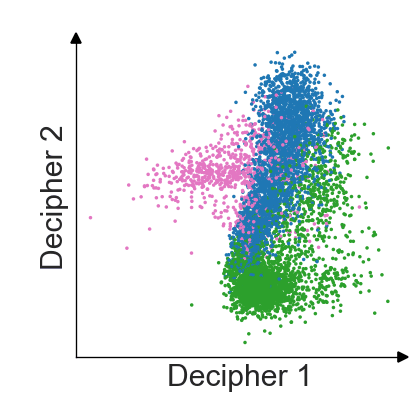

2026-03-29 22:46:16,246 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-03-29 22:46:16,247 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-03-29 22:46:16,247 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-03-29 22:46:16,509 | INFO : Trajectory CD8_class : ['CD8+ tissue resident memory T cells', 'CD8+ effector T cells', 'CD8+ proliferating T cells'])
2026-03-29 22:46:16,511 | INFO : Added trajectory CD8_class to `adata.uns['decipher']['trajectories']`.
2026-03-29 22:46:16,509 | INFO : Trajectory CD8_class : ['CD8+ tissue resident memory T cells', 'CD8+ effector T cells', 'CD8+ proliferating T cells'])
2026-03-29 22:46:16,511 | INFO : Added trajectory CD8_class to `adata.uns['decipher']['trajectories']`.


In [126]:
# --- Train ---
color_palette = Tcell.uns["color_palette"]
decipher_config = dc.tl.DecipherConfig(seed=11)
d3, val3 = dc.tl.decipher_train(
    Tcell_sc_3_7000deg, decipher_config,
    plot_kwargs={"color": "T_cell_subsets", "palette": color_palette},
    plot_every_k_epochs=1
)

# --- Validation loss curve ---
fig, ax = plt.subplots()
ax.plot(val3)
plt.close(fig)


# --- Scatter plots per metadata ---
color_cols = ['T_cell_subsets', 'GVHD_Grade_1', 'LPorIE', 'Tissue_Location',
              'Transplant_Conditioning', 'Donor', 'PatientID']
for meta in color_cols:
    randomize = np.arange(len(Tcell_sc_3_7000deg.obs[meta]))
    np.random.shuffle(randomize)
    fig, ax = plt.subplots(figsize=(6, 6), dpi=150)
    sns.set_style("whitegrid", {'axes.grid': False})
    sns.scatterplot(
        x=Tcell_sc_3_7000deg.obsm["decipher_v"][:, 0][randomize],
        y=Tcell_sc_3_7000deg.obsm["decipher_v"][:, 1][randomize],
        hue=Tcell_sc_3_7000deg.obs[meta][randomize],
        s=12, ax=ax
    ).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    ax.set_xlabel('Decipher 1')
    ax.set_ylabel('Decipher 2')
    plt.close(fig)

# --- Naive signature ---
naive_genes = ['IL7R']
Tcell_sc_3_7000deg.obs['naive'] = (
    np.sum(Tcell_sc_3_7000deg.to_df().loc[:, naive_genes], axis=1) / len(naive_genes)
)
fig, ax = plt.subplots(figsize=(5, 4))
scatter = ax.scatter(
    Tcell_sc_3_7000deg.obsm['decipher_v'][:, 0],
    Tcell_sc_3_7000deg.obsm['decipher_v'][:, 1],
    c=Tcell_sc_3_7000deg.obs['naive'], s=0.01, vmin=0, vmax=5
)
plt.colorbar(scatter).set_label('naive')

plt.close(fig)


# --- Rotate + decipher plots ---
dc.tl.decipher_rotate_space(
    Tcell_sc_3_7000deg,
    v1_col="T_cell_subsets",
    v1_order=['CD8+ tissue resident memory T cells', 'CD8+ effector T cells'],
)
fig1 = dc.pl.decipher(Tcell_sc_3_7000deg, ["T_cell_subsets"], palette=color_palette)
plt.close(fig1)


fig3 = dc.pl.decipher_z(Tcell_sc_3_7000deg)
plt.close(fig3)


# --- Trajectories ---
Tcell_sc_3_7000deg.obs["decipher_clusters"] = Tcell_sc_3_7000deg.obs["T_cell_subsets"]
dc.tl.trajectories(
    Tcell_sc_3_7000deg,
    dc.tl.TConfig("CD8_class",
                  start_cluster_or_marker='CD8+ tissue resident memory T cells',
                  end_cluster_or_marker='CD8+ proliferating T cells')
)

Tcell_sc_3_7000deg.write(TCONVS_REFINED_DC_PATH)

# Analysis after training the decipher model

In [6]:
Tcell_sc_3_7000deg = anndata.read_h5ad(TCONVS_REFINED_DC_PATH)

In [7]:
tcell_ann_concat = anndata.read_h5ad(TCELL_ANN_CONCAT_PATH)

In [8]:
# Columns you want to transfer from Tcell_migration to the subset
cols_to_transfer = tcell_ann_concat.obs.columns.tolist()

cols_to_transfer = ['sample_type']

# Drop cols if they already exist in the subset to avoid conflicts
existing = [c for c in cols_to_transfer if c in Tcell_sc_3_7000deg.obs.columns]
Tcell_sc_3_7000deg.obs = Tcell_sc_3_7000deg.obs.drop(columns=existing)

# Transfer
Tcell_sc_3_7000deg.obs = Tcell_sc_3_7000deg.obs.join(
    tcell_ann_concat.obs[cols_to_transfer],
    how='left'
)

In [9]:
dc.tl.decipher_rotate_space(
        Tcell_sc_3_7000deg,
        v1_col = 'naive',
    v1_order = Tcell_sc_3_7000deg.obs.sort_values(by='naive')
    
    )

2026-03-30 22:59:38,937 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-03-30 22:59:38,938 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-03-30 22:59:38,938 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


2026-03-30 22:59:39,395 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-03-30 22:59:39,396 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-03-30 22:59:39,396 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


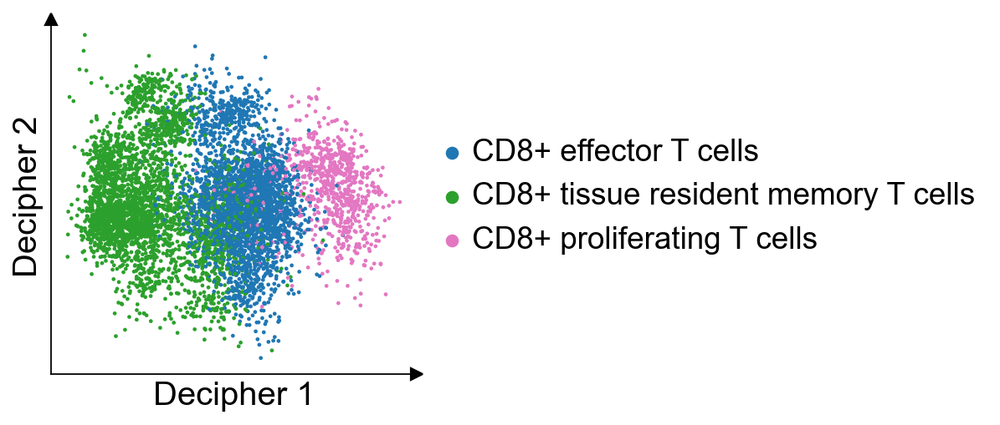

In [10]:
dc.tl.decipher_rotate_space(
    Tcell_sc_3_7000deg,
    v1_col="T_cell_subsets",
    v1_order=['CD8+ tissue resident memory T cells', 'CD8+ effector T cells'],

)
dc.pl.decipher(Tcell_sc_3_7000deg, ["T_cell_subsets"])

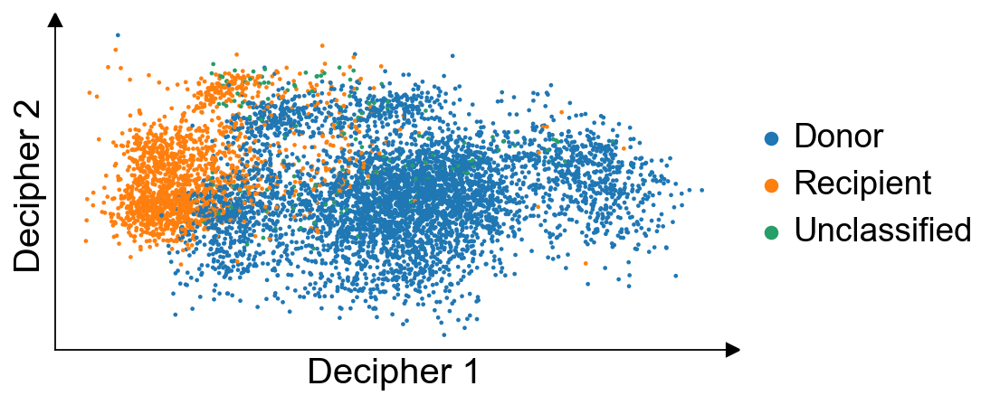

In [11]:
dc.pl.decipher(Tcell_sc_3_7000deg, ["sample_type"], figsize=(6, 3))

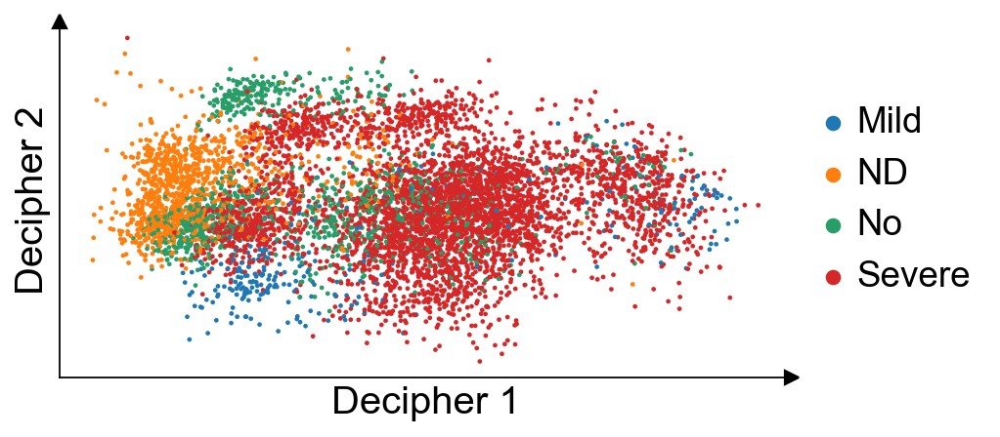

In [12]:
dc.pl.decipher(Tcell_sc_3_7000deg, ["GVHD_Grade_1"], figsize=(6, 3))

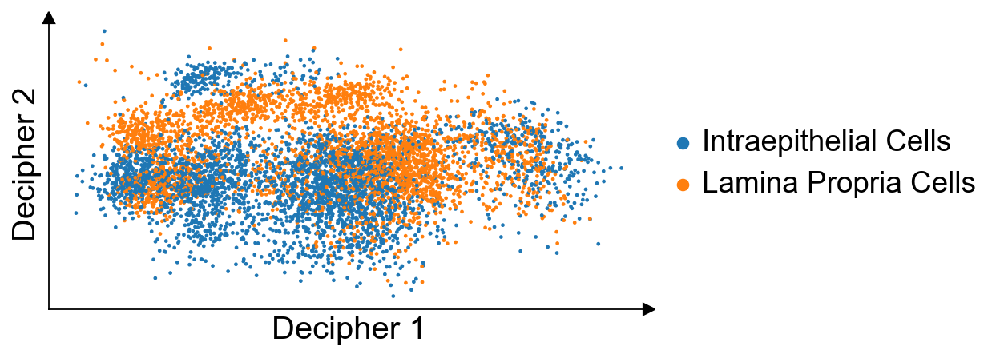

In [13]:
dc.pl.decipher(Tcell_sc_3_7000deg, ["LPorIE"], figsize=(6, 3))

In [14]:
Tcell_sc_3_7000deg.obs['GVHD_Grade_1'].value_counts()

GVHD_Grade_1
Severe    4216
No        1134
ND        1044
Mild       315
Name: count, dtype: int64

In [15]:
palette = {'Donor': '#e76f51', 'Recipient': '#2a9d8f'}

In [16]:
# remove unclassified samples and use these two colors to plot the decipher space colored by sample type'Donor': '#e76f51', 'Recipient': '#2a9d8f'
dc.pl.decipher(Tcell_sc_3_7000deg[Tcell_sc_3_7000deg.obs['sample_type']!='Unclassified'], ['sample_type'], palette=palette, size = 20, figsize=(6, 3))
plt.tight_layout() 
plt.savefig(FIGURES_TRA_DIR / 'Transition_decipher_DR.png', dpi=300)

# Save the plot as PDF
plt.savefig(FIGURES_TRA_DIR / 'Transition_decipher_DR.pdf', dpi=300)

2026-03-30 22:59:42,261 | INFO : maxp pruned
2026-03-30 22:59:42,263 | INFO : LTSH dropped
2026-03-30 22:59:42,264 | INFO : cmap pruned
2026-03-30 22:59:42,265 | INFO : kern dropped
2026-03-30 22:59:42,266 | INFO : post pruned
2026-03-30 22:59:42,267 | INFO : PCLT dropped
2026-03-30 22:59:42,267 | INFO : JSTF dropped
2026-03-30 22:59:42,268 | INFO : DSIG dropped
2026-03-30 22:59:42,269 | INFO : GPOS pruned
2026-03-30 22:59:42,270 | INFO : GSUB pruned
2026-03-30 22:59:42,272 | INFO : glyf pruned
2026-03-30 22:59:42,263 | INFO : LTSH dropped
2026-03-30 22:59:42,264 | INFO : cmap pruned
2026-03-30 22:59:42,265 | INFO : kern dropped
2026-03-30 22:59:42,266 | INFO : post pruned
2026-03-30 22:59:42,267 | INFO : PCLT dropped
2026-03-30 22:59:42,267 | INFO : JSTF dropped
2026-03-30 22:59:42,268 | INFO : DSIG dropped
2026-03-30 22:59:42,269 | INFO : GPOS pruned
2026-03-30 22:59:42,270 | INFO : GSUB pruned
2026-03-30 22:59:42,272 | INFO : glyf pruned
2026-03-30 22:59:42,273 | INFO : Added gid0 t

In [17]:
for col in cols_to_transfer:
    if hasattr(Tcell_sc_3_7000deg.obs[col], 'cat'):
        Tcell_sc_3_7000deg.obs[col] = Tcell_sc_3_7000deg.obs[col].cat.remove_unused_categories()

# Verify
print(Tcell_sc_3_7000deg.obs['T_cell_subsets_refined_resi'].unique())

['CD8+ effector T cells', 'CD8+ Hobit+ PRDM1+ resident memory T cells', 'CD8+ Hobit- resident memory T cells', 'CD8+ proliferating T cells', 'CD8+ Hobit+ PRDM1-lo resident memory T cells']
Categories (5, object): ['CD8+ effector T cells' < 'CD8+ proliferating T cells' < 'CD8+ Hobit+ PRDM1+ resident memory T cells' < 'CD8+ Hobit+ PRDM1-lo resident memory T cells' < 'CD8+ Hobit- resident memory T cells']


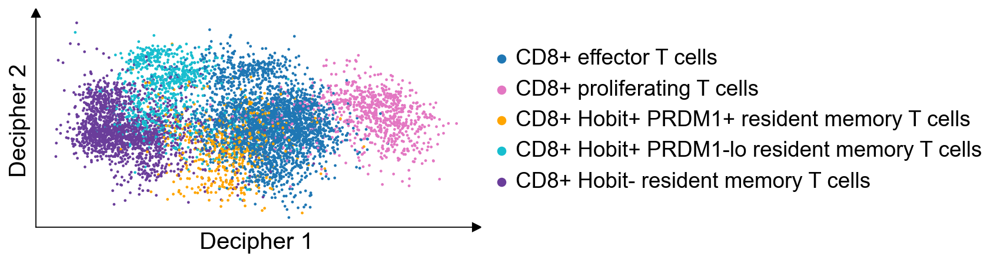

In [18]:
celltype_colors = {
    'CD8+ Hobit+ PRDM1+ resident memory T cells': '#FFA500',
    'CD8+ Hobit+ PRDM1-lo resident memory T cells':   '#17becf',
    'CD8+ Hobit- resident memory T cells':             '#6a3d9a',
    'CD8+ effector T cells':                           '#1f77b4',
    'CD8+ proliferating T cells':                      '#e377c2',
}

# Build color list in category order — safe regardless of category ordering
unique_clusters = Tcell_sc_3_7000deg.obs['T_cell_subsets_refined_resi'].cat.categories
Tcell_sc_3_7000deg.uns['T_cell_subsets_refined_resi_colors'] = [celltype_colors[ct] for ct in unique_clusters]

palette = celltype_colors
dc.pl.decipher(Tcell_sc_3_7000deg, ['T_cell_subsets_refined_resi'], palette=palette, figsize=(6, 3))

In [19]:
dc.pl.decipher(Tcell_sc_3_7000deg, ['T_cell_subsets_refined_resi'], palette=palette, size = 20, figsize=(12, 3))
plt.tight_layout() 
plt.show()
plt.savefig(FIGURES_TRA_DIR / 'Transition_decipher.png', dpi=300)
plt.savefig(FIGURES_TRA_DIR / 'Transition_decipher.pdf', dpi=300)

2026-03-30 22:59:43,598 | INFO : maxp pruned
2026-03-30 22:59:43,598 | INFO : LTSH dropped
2026-03-30 22:59:43,599 | INFO : cmap pruned
2026-03-30 22:59:43,599 | INFO : kern dropped
2026-03-30 22:59:43,601 | INFO : post pruned
2026-03-30 22:59:43,601 | INFO : PCLT dropped
2026-03-30 22:59:43,601 | INFO : JSTF dropped
2026-03-30 22:59:43,601 | INFO : DSIG dropped
2026-03-30 22:59:43,603 | INFO : GPOS pruned
2026-03-30 22:59:43,604 | INFO : GSUB pruned
2026-03-30 22:59:43,606 | INFO : glyf pruned
2026-03-30 22:59:43,607 | INFO : Added gid0 to subset
2026-03-30 22:59:43,607 | INFO : Added first four glyphs to subset
2026-03-30 22:59:43,607 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-03-30 22:59:43,608 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'H', 'M', 'P', 'R', 'T', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'plus', 'r', 's', 'space', 't', 'two', 'y']
2026-03-30 22:59:43,598 | INFO : LT

In [20]:
dc.pl.decipher(Tcell_sc_3_7000deg, ['PatientID'], size = 20, figsize=(12, 3))
plt.tight_layout() 
plt.show()
plt.savefig(FIGURES_TRA_DIR / 'Transition_decipher_patient.png', dpi=300)
plt.savefig(FIGURES_TRA_DIR / 'Transition_decipher_patient.pdf', dpi=300)
plt.savefig(FIGURES_TRA_DIR / 'Transition_decipher_patient.svg', dpi=300)

2026-03-30 22:59:44,312 | INFO : maxp pruned
2026-03-30 22:59:44,312 | INFO : LTSH dropped
2026-03-30 22:59:44,312 | INFO : cmap pruned
2026-03-30 22:59:44,313 | INFO : kern dropped
2026-03-30 22:59:44,314 | INFO : post pruned
2026-03-30 22:59:44,314 | INFO : PCLT dropped
2026-03-30 22:59:44,315 | INFO : JSTF dropped
2026-03-30 22:59:44,315 | INFO : DSIG dropped
2026-03-30 22:59:44,316 | INFO : GPOS pruned
2026-03-30 22:59:44,317 | INFO : GSUB pruned
2026-03-30 22:59:44,318 | INFO : glyf pruned
2026-03-30 22:59:44,319 | INFO : Added gid0 to subset
2026-03-30 22:59:44,320 | INFO : Added first four glyphs to subset
2026-03-30 22:59:44,320 | INFO : Closing glyph list over 'GSUB': 23 glyphs before
2026-03-30 22:59:44,320 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'N', 'R', 'c', 'e', 'eight', 'five', 'h', 'i', 'nine', 'nonmarkingreturn', 'one', 'p', 'r', 'seven', 'six', 'space', 'three', 'two', 'zero']
2026-03-30 22:59:44,320 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 24, 

In [49]:
import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 8, 'svg.fonttype': 'none'})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size
mpl.rcParams['legend.fontsize'] = 8

Tcell_sc_3_7000deg.uns['ExpandedorSingleton_colors'] = ['#2A9487', '#e7ecef', '#46085C']
cmap = plt.cm.viridis.copy()
color=['ITGAE','GZMA','ZNF683']

fig = dc.pl.decipher(
    Tcell_sc_3_7000deg,
    color,
    ncols=3,
    vmax=lambda x: np.quantile(x, 0.99),
    axis_type=None,
    size = 2,
    cmap=cmap) 

fig.set_size_inches(9, 1)

plt.tight_layout() 
plt.show()
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_genes.png', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_genes.pdf', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_genes.svg', dpi=300, transparent=True)

... storing 'cc_aa_identity_Grade' as categorical
2026-03-31 01:20:33,372 | INFO : maxp pruned
2026-03-31 01:20:33,373 | INFO : LTSH dropped
2026-03-31 01:20:33,373 | INFO : cmap pruned
2026-03-31 01:20:33,373 | INFO : kern dropped
2026-03-31 01:20:33,375 | INFO : post pruned
2026-03-31 01:20:33,375 | INFO : PCLT dropped
2026-03-31 01:20:33,376 | INFO : JSTF dropped
2026-03-31 01:20:33,376 | INFO : DSIG dropped
2026-03-31 01:20:33,377 | INFO : GPOS pruned
2026-03-31 01:20:33,379 | INFO : GSUB pruned
2026-03-31 01:20:33,381 | INFO : glyf pruned
2026-03-31 01:20:33,382 | INFO : Added gid0 to subset
2026-03-31 01:20:33,382 | INFO : Added first four glyphs to subset
2026-03-31 01:20:33,372 | INFO : maxp pruned
2026-03-31 01:20:33,373 | INFO : LTSH dropped
2026-03-31 01:20:33,373 | INFO : cmap pruned
2026-03-31 01:20:33,373 | INFO : kern dropped
2026-03-31 01:20:33,375 | INFO : post pruned
2026-03-31 01:20:33,375 | INFO : PCLT dropped
2026-03-31 01:20:33,376 | INFO : JSTF dropped
2026-03-31

In [22]:
color=['ITGAE','GZMA','GZMB','CTLA4','PDCD1','IL7R','ZNF683',"GVHD_Grade_1","TOX", "HAVCR2", "LAG3",'T_cell_subsets', 'LPorIE']

fig = dc.pl.decipher(
    Tcell_sc_3_7000deg,
    color,
    vmax=lambda x: np.quantile(x, 0.99),
    axis_type=None,
    size = 5,
    cmap=cmap) 

plt.tight_layout() 
plt.show()

fig.set_size_inches(9, 7)

fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_genes_hobit.png', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_genes_hobit.pdf', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_genes_hobit.svg', dpi=300, transparent=True)

2026-03-30 22:59:46,925 | INFO : maxp pruned
2026-03-30 22:59:46,925 | INFO : LTSH dropped
2026-03-30 22:59:46,926 | INFO : cmap pruned
2026-03-30 22:59:46,926 | INFO : kern dropped
2026-03-30 22:59:46,928 | INFO : post pruned
2026-03-30 22:59:46,928 | INFO : PCLT dropped
2026-03-30 22:59:46,928 | INFO : JSTF dropped
2026-03-30 22:59:46,928 | INFO : DSIG dropped
2026-03-30 22:59:46,930 | INFO : GPOS pruned
2026-03-30 22:59:46,931 | INFO : GSUB pruned
2026-03-30 22:59:46,933 | INFO : glyf pruned
2026-03-30 22:59:46,935 | INFO : Added gid0 to subset
2026-03-30 22:59:46,935 | INFO : Added first four glyphs to subset
2026-03-30 22:59:46,935 | INFO : Closing glyph list over 'GSUB': 54 glyphs before
2026-03-30 22:59:46,925 | INFO : LTSH dropped
2026-03-30 22:59:46,926 | INFO : cmap pruned
2026-03-30 22:59:46,926 | INFO : kern dropped
2026-03-30 22:59:46,928 | INFO : post pruned
2026-03-30 22:59:46,928 | INFO : PCLT dropped
2026-03-30 22:59:46,928 | INFO : JSTF dropped
2026-03-30 22:59:46,928

In [23]:
color=['ExpandedorSingleton']

fig = dc.pl.decipher(
    Tcell_sc_3_7000deg,
    color,
    ncols=3,
    vmax=lambda x: np.quantile(x, 0.99),
    axis_type=None,
    size = 5) 

fig.set_size_inches(4.5, 1.5)

plt.tight_layout() 
plt.show()
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_genes_clone.png', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_genes_clone.pdf', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_genes_clone.svg', dpi=300, transparent=True)

2026-03-30 22:59:48,640 | INFO : maxp pruned
2026-03-30 22:59:48,640 | INFO : LTSH dropped
2026-03-30 22:59:48,641 | INFO : cmap pruned
2026-03-30 22:59:48,641 | INFO : kern dropped
2026-03-30 22:59:48,643 | INFO : post pruned
2026-03-30 22:59:48,643 | INFO : PCLT dropped
2026-03-30 22:59:48,643 | INFO : JSTF dropped
2026-03-30 22:59:48,643 | INFO : DSIG dropped
2026-03-30 22:59:48,645 | INFO : GPOS pruned
2026-03-30 22:59:48,646 | INFO : GSUB pruned
2026-03-30 22:59:48,647 | INFO : glyf pruned
2026-03-30 22:59:48,648 | INFO : Added gid0 to subset
2026-03-30 22:59:48,648 | INFO : Added first four glyphs to subset
2026-03-30 22:59:48,649 | INFO : Closing glyph list over 'GSUB': 17 glyphs before
2026-03-30 22:59:48,649 | INFO : Glyph names: ['.notdef', '.null', 'E', 'S', 'a', 'd', 'e', 'g', 'i', 'l', 'n', 'nonmarkingreturn', 'o', 'p', 'space', 't', 'x']
2026-03-30 22:59:48,640 | INFO : LTSH dropped
2026-03-30 22:59:48,641 | INFO : cmap pruned
2026-03-30 22:59:48,641 | INFO : kern dropped

... storing 'cc_aa_identity_Grade' as categorical


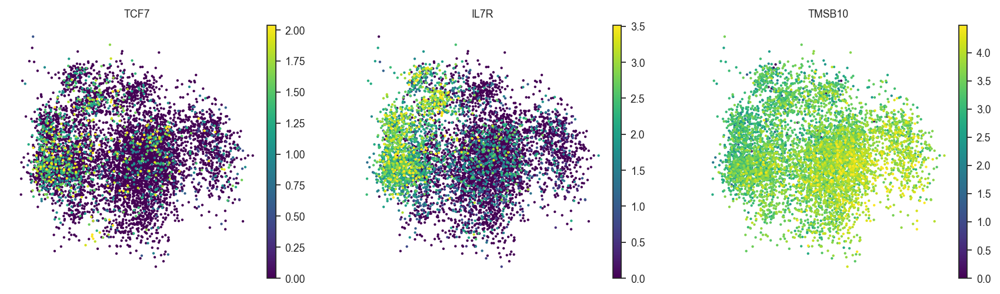

In [50]:
trm_genes = [
"TCF7", "IL7R", "TMSB10"
]

dc.pl.decipher(
    Tcell_sc_3_7000deg,
    trm_genes,
    ncols=3,
    vmax=lambda x: np.quantile(x, 0.99),
    axis_type=None,
    size = 15) 

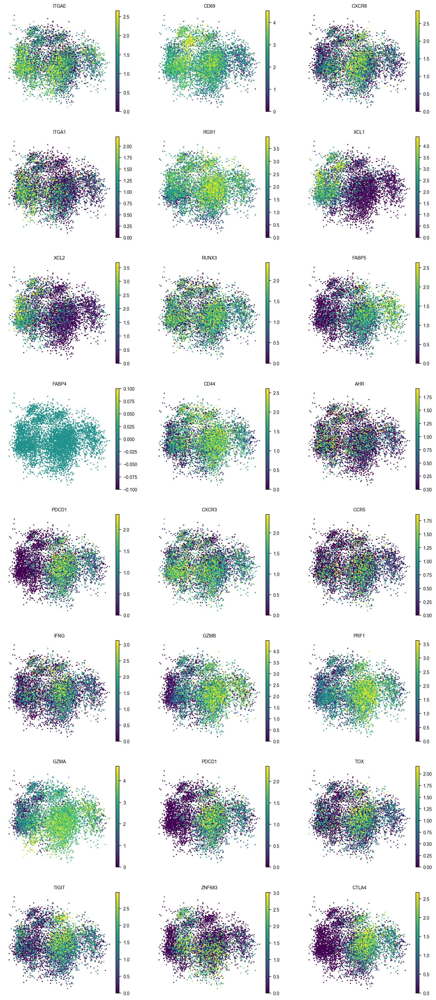

In [24]:
trm_genes = [
    "ITGAE",   # CD103
    "CD69",
    "CXCR6",
    "ITGA1",   # CD49a
    "RGS1",
    "XCL1",
    "XCL2",
    "RUNX3",
    "FABP5",
    "FABP4",
    "CD44",
    "AHR",
    "PDCD1",
    "CXCR3",
    "CCR5",
    "IFNG",
    "GZMB",
    "PRF1",
    'GZMA',
    "PDCD1",
    "TOX",
    "TIGIT",
    "ZNF683",
    "CTLA4"
]

dc.pl.decipher(
    Tcell_sc_3_7000deg,
    trm_genes,
    ncols=3,
    vmax=lambda x: np.quantile(x, 0.99),
    axis_type=None,
    size = 15) 

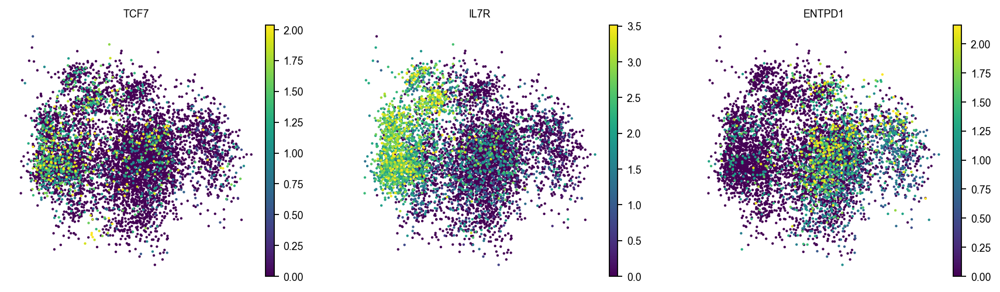

In [25]:
trm_genes = [
    "TCF7",   # CD10
    "IL7R",   # CD127
    "ENTPD1",   # CD62L
]

dc.pl.decipher(
    Tcell_sc_3_7000deg,
    trm_genes,
    ncols=3,
    vmax=lambda x: np.quantile(x, 0.99),
    axis_type=None,
    size = 15) 

2026-03-30 22:59:51,263 | INFO : maxp pruned
2026-03-30 22:59:51,263 | INFO : LTSH dropped
2026-03-30 22:59:51,264 | INFO : cmap pruned
2026-03-30 22:59:51,264 | INFO : kern dropped
2026-03-30 22:59:51,265 | INFO : post pruned
2026-03-30 22:59:51,266 | INFO : PCLT dropped
2026-03-30 22:59:51,266 | INFO : JSTF dropped
2026-03-30 22:59:51,266 | INFO : DSIG dropped
2026-03-30 22:59:51,268 | INFO : GPOS pruned
2026-03-30 22:59:51,268 | INFO : GSUB pruned
2026-03-30 22:59:51,270 | INFO : glyf pruned
2026-03-30 22:59:51,271 | INFO : Added gid0 to subset
2026-03-30 22:59:51,272 | INFO : Added first four glyphs to subset
2026-03-30 22:59:51,272 | INFO : Closing glyph list over 'GSUB': 18 glyphs before
2026-03-30 22:59:51,272 | INFO : Glyph names: ['.notdef', '.null', 'A', 'E', 'F', 'G', 'I', 'N', 'T', 'Z', 'eight', 'nonmarkingreturn', 'one', 'six', 'space', 'three', 'two', 'zero']
2026-03-30 22:59:51,263 | INFO : LTSH dropped
2026-03-30 22:59:51,264 | INFO : cmap pruned
2026-03-30 22:59:51,264

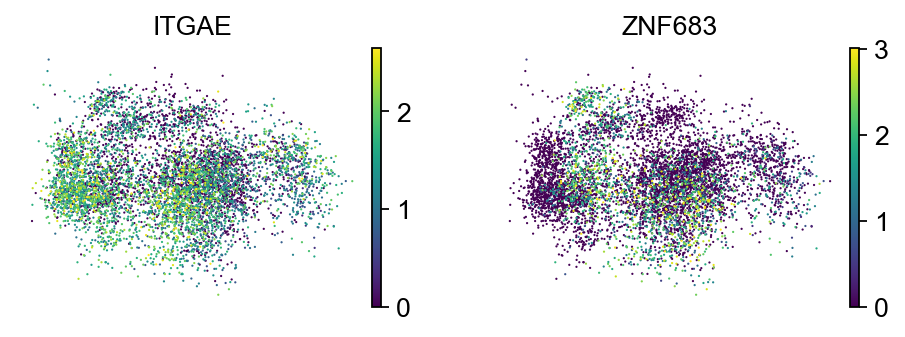

In [26]:
import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 12, 'svg.fonttype': 'none'})
mpl.rcParams['axes.titlesize'] = 12
mpl.rcParams['xtick.labelsize'] = 12  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 12  # Colorbar tick label size
mpl.rcParams['legend.fontsize'] = 12

cmap = plt.cm.viridis.copy()
trm_genes = [
    "ITGAE",   # CD103
    "ZNF683",  # Hobit
]

fig = dc.pl.decipher(
    Tcell_sc_3_7000deg,
    trm_genes,
    ncols=2,
    vmax=lambda x: np.quantile(x, 0.99),
    axis_type=None,
    size = 4,
    cmap=cmap) 

fig.set_size_inches(6.8, 2.1)

plt.tight_layout() 
plt.show()
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_trm_genes_1.png', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_trm_genes_1.pdf', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_trm_genes_1.svg', dpi=300, transparent=True)
display(fig)

2026-03-30 22:59:52,355 | INFO : maxp pruned
2026-03-30 22:59:52,356 | INFO : LTSH dropped
2026-03-30 22:59:52,356 | INFO : cmap pruned
2026-03-30 22:59:52,356 | INFO : kern dropped
2026-03-30 22:59:52,358 | INFO : post pruned
2026-03-30 22:59:52,358 | INFO : PCLT dropped
2026-03-30 22:59:52,359 | INFO : JSTF dropped
2026-03-30 22:59:52,359 | INFO : DSIG dropped
2026-03-30 22:59:52,360 | INFO : GPOS pruned
2026-03-30 22:59:52,361 | INFO : GSUB pruned
2026-03-30 22:59:52,364 | INFO : glyf pruned
2026-03-30 22:59:52,365 | INFO : Added gid0 to subset
2026-03-30 22:59:52,356 | INFO : LTSH dropped
2026-03-30 22:59:52,356 | INFO : cmap pruned
2026-03-30 22:59:52,356 | INFO : kern dropped
2026-03-30 22:59:52,358 | INFO : post pruned
2026-03-30 22:59:52,358 | INFO : PCLT dropped
2026-03-30 22:59:52,359 | INFO : JSTF dropped
2026-03-30 22:59:52,359 | INFO : DSIG dropped
2026-03-30 22:59:52,360 | INFO : GPOS pruned
2026-03-30 22:59:52,361 | INFO : GSUB pruned
2026-03-30 22:59:52,364 | INFO : gly

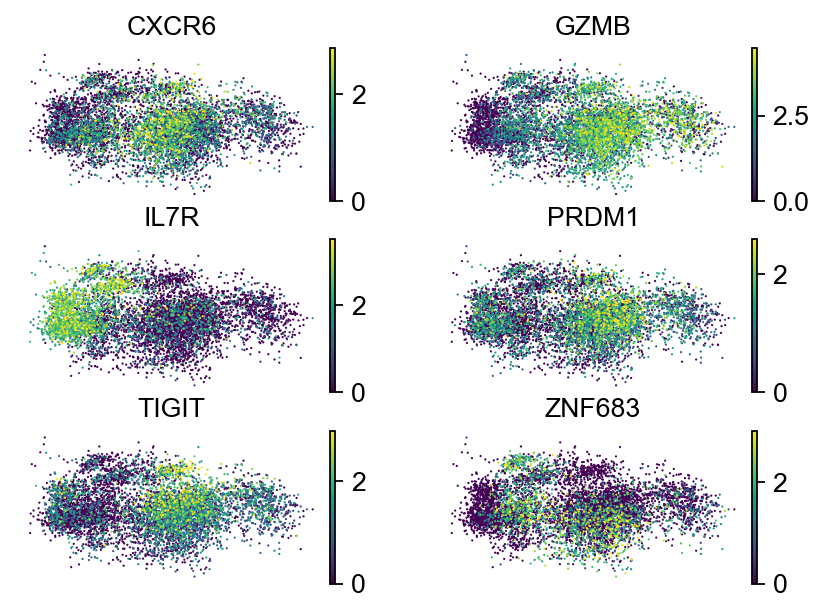

In [27]:
import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 12, 'svg.fonttype': 'none'})
mpl.rcParams['axes.titlesize'] = 12
mpl.rcParams['xtick.labelsize'] = 12  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 12  # Colorbar tick label size
mpl.rcParams['legend.fontsize'] = 12

cmap = plt.cm.viridis.copy()
trm_genes = [
    "CXCR6",
    "GZMB",
    "IL7R",
    "PRDM1",
    'TIGIT',
    "ZNF683"
]

fig = dc.pl.decipher(
    Tcell_sc_3_7000deg,
    trm_genes,
    ncols=2,
    vmax=lambda x: np.quantile(x, 0.99),
    axis_type=None,
    size = 4,
    cmap=cmap) 

fig.set_size_inches(6, 4)

plt.tight_layout() 
plt.show()
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_trm_genes_2.png', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_trm_genes_2.pdf', dpi=300, transparent=True)
fig.savefig(FIGURES_TRA_DIR / 'Transition_decipher_trm_genes_2.svg', dpi=300, transparent=True)
display(fig)

In [28]:
color = [ 'GVHD_Grade_1', 'LPorIE', 'Tissue_Location', "T_cell_subsets_refined_resi", 
         'Transplant_Conditioning', 'Donor', 'cc_aa_identity_size_norm','PatientID']
#### Plot meta
for meta in color:
    # Create random indices for shuffling
    randomize = np.arange(len(Tcell_sc_3_7000deg.obs[meta]))
    np.random.shuffle(randomize)
    
    # Create figure
    fig, ax = plt.subplots(figsize=(9, 3), dpi=300)
    
    # Remove grid and set style
    sns.set_style("white")
    ax.grid(False)
    
    # Create scatter plot
    sns.scatterplot(
        x=Tcell_sc_3_7000deg.obsm["decipher_v"][:, 0][randomize],
        y=Tcell_sc_3_7000deg.obsm["decipher_v"][:, 1][randomize],
        hue=Tcell_sc_3_7000deg.obs[meta][randomize],
        s=6,
        ax=ax
    )
    
    # Customize the plot
    ax.set_title(meta, pad=10, fontsize=12)
    
    # Remove all spines
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    # Remove tick labels
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    
    # Remove ticks
    ax.tick_params(axis='both', which='both', length=0)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Calculate arrow lengths
    arrow_length_x = (xmax - xmin) * 0.1
    arrow_length_y = (ymax - ymin) * 0.3
    
    # Calculate arrow start positions
    arrow_start_x = xmin + (xmax - xmin) * 0.1
    arrow_start_y = ymin + (ymax - ymin) * 0.1
    
    # Add arrows for axes in lower left corner
    # X-axis arrow
    ax.annotate('', 
                xy=(arrow_start_x + arrow_length_x, arrow_start_y), 
                xytext=(arrow_start_x, arrow_start_y),
                arrowprops=dict(arrowstyle='->',
                              linewidth=1.5,
                              color='black'))
    
    # Y-axis arrow
    ax.annotate('', 
                xy=(arrow_start_x, arrow_start_y + arrow_length_y), 
                xytext=(arrow_start_x, arrow_start_y),
                arrowprops=dict(arrowstyle='->',
                              linewidth=1.5,
                              color='black'))
    
    # Add axis labels next to arrows
    ax.text(arrow_start_x + arrow_length_x/2, 
            arrow_start_y - (ymax-ymin)*0.05, 
            'Decipher 1', 
            ha='center', va='top', fontsize=16)
    
    ax.text(arrow_start_x - (xmax-xmin)*0.02, 
            arrow_start_y + arrow_length_y/2, 
            'Decipher 2', 
            ha='right', va='center', rotation=90, fontsize=16)
    
    # Remove default axis labels
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    # Customize legend
    plt.legend(
        bbox_to_anchor=(1.02, 1),
        loc='upper left',
        borderaxespad=0,
        frameon=False,
        fontsize=8
    )
    
    # Adjust layout
    plt.tight_layout()
    
    # Save figures
    plt.savefig(
        FIGURES_TRA_DIR / f'{meta}_decipher.pdf',
        transparent=True,
        bbox_inches='tight',
        dpi=300
    )
    plt.savefig(
        FIGURES_TRA_DIR / f'{meta}_decipher.png',
        transparent=True,
        bbox_inches='tight',
        dpi=300
    )
    
    # Close the figure to free memory
    plt.close()

2026-03-30 22:59:53,287 | INFO : maxp pruned
2026-03-30 22:59:53,288 | INFO : LTSH dropped
2026-03-30 22:59:53,288 | INFO : cmap pruned
2026-03-30 22:59:53,288 | INFO : kern dropped
2026-03-30 22:59:53,290 | INFO : post pruned
2026-03-30 22:59:53,290 | INFO : PCLT dropped
2026-03-30 22:59:53,290 | INFO : JSTF dropped
2026-03-30 22:59:53,290 | INFO : DSIG dropped
2026-03-30 22:59:53,292 | INFO : GPOS pruned
2026-03-30 22:59:53,293 | INFO : GSUB pruned
2026-03-30 22:59:53,294 | INFO : glyf pruned
2026-03-30 22:59:53,295 | INFO : Added gid0 to subset
2026-03-30 22:59:53,295 | INFO : Added first four glyphs to subset
2026-03-30 22:59:53,296 | INFO : Closing glyph list over 'GSUB': 25 glyphs before
2026-03-30 22:59:53,296 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'H', 'M', 'N', 'S', 'V', 'a', 'c', 'd', 'e', 'h', 'i', 'l', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 'space', 'two', 'underscore', 'v']
2026-03-30 22:59:53,288 | INFO : LTSH dropped
2026-03-30 22:59:53,288 | INFO : cmap

In [29]:
Tcell_sc_3_7000deg.obs['cc_aa_identity_Grade'] = Tcell_sc_3_7000deg.obs['cc_aa_identity'].astype(str)+'_'+Tcell_sc_3_7000deg.obs['GVHD_Grade_1'].astype(str)+'_'+Tcell_sc_3_7000deg.obs['PatientID'].astype(str)+'_'+Tcell_sc_3_7000deg.obs['Tissue_Location'].astype(str)+'_'+Tcell_sc_3_7000deg.obs['Dates_from_Transplantation'].astype(str)

In [30]:
Tcell_sc_3_7000deg.uns['LPorIE_colors'] = ['#43aa8b' ,'#735751']

In [31]:
def plot_cell_transitions_stream(
    adata, 
    category_key,
    category_1,
    category_2,
    cell_type_key,
    color_cat = 'leiden_new_cluster_2',
    basis='umap',
    n_grid=50,
    smooth=0.5,
    min_mass=1,
    density=2,
    arrow_size=1,
    linewidth=1,
    density_threshold=0.5,
    figsize=(20, 20),
    scale_arrows_by_clone_size=True,
    min_arrow_width=0.5,
    max_arrow_width=5,
    # Add parameters for small clone filtering
    show_only_small_clones=True,
    small_clone_threshold=20,  # Maximum size to consider a clone "small"
    arrow_x_frac=-0.15,        # negative = left of x_min, outside cell cloud
):
    # Get coordinates and metadata
    coords = pd.DataFrame(
        adata.obsm[basis],
        columns=[f'{basis}_1', f'{basis}_2'],
        index=adata.obs.index
    )
    
    X_emb = np.column_stack([coords[f'{basis}_1'], coords[f'{basis}_2']])
    
    # Calculate bounds with padding
    hull = ConvexHull(X_emb)
    hull_points = X_emb[hull.vertices]
    padding = 0.02
    mins = np.min(hull_points, axis=0) - padding * np.ptp(hull_points, axis=0)
    maxs = np.max(hull_points, axis=0) + padding * np.ptp(hull_points, axis=0)
    x_min, y_min = mins
    x_max, y_max = maxs
    
    # Create grid
    x_grid = np.linspace(x_min, x_max, n_grid)
    y_grid = np.linspace(y_min, y_max, n_grid)
    xx, yy = np.meshgrid(x_grid, y_grid)
    grid_points = np.vstack([xx.ravel(), yy.ravel()]).T
    
    # Store clone transitions and sizes without categorizing
    clone_transitions = {}
    clone_sizes = {}
    clone_centers = {}
    
    # First pass to identify clone sizes
    temp_clone_sizes = {}
    for clone in adata.obs[cell_type_key].unique():
        clone_mask = adata.obs[cell_type_key] == clone
        temp_clone_sizes[clone] = np.sum(clone_mask)
    
    # Second pass to filter and store only the clones we want to show
    for clone in adata.obs[cell_type_key].unique():
        # Skip if not a small clone when we only want small clones
        if show_only_small_clones and temp_clone_sizes[clone] > small_clone_threshold:
            continue
            
        clone_mask = adata.obs[cell_type_key] == clone
        cat1_mask = clone_mask & (adata.obs[category_key] == category_1)
        cat2_mask = clone_mask & (adata.obs[category_key] == category_2)
        
        if np.sum(cat1_mask) >= 1 and np.sum(cat2_mask) >= 1:
            # Calculate mean positions
            start = np.mean(X_emb[cat1_mask], axis=0)
            end = np.mean(X_emb[cat2_mask], axis=0)
            
            # Store clone size and transition vector
            clone_sizes[clone] = np.sum(clone_mask)
            clone_transitions[clone] = end - start
            
            # Store the center position of the clone (for spatial weighting)
            clone_centers[clone] = np.mean(X_emb[clone_mask], axis=0)
    
    # Set up nearest neighbors
    n_neighbors = min(int(len(X_emb) / 50), 50)
    nn = NearestNeighbors(n_neighbors=n_neighbors)
    nn.fit(X_emb)
    dists, neighs = nn.kneighbors(grid_points)
    
    # Calculate weights
    sigma = np.mean([x_max - x_min, y_max - y_min]) * smooth / n_grid
    weights = normal.pdf(x=dists, scale=sigma)
    weights = weights / weights.sum(1)[:, None]
    
    # Calculate cell density and mask
    kde = gaussian_kde(X_emb.T)
    z = kde(grid_points.T)
    z = z / np.max(z)
    density_mask = z > density_threshold
    
    # Normalize clone sizes for scaling
    if clone_sizes:
        max_clone_size = max(clone_sizes.values())
        min_clone_size = min(clone_sizes.values())
        size_range = max_clone_size - min_clone_size
    
    # Calculate unified vector field and width field
    V_grid = np.zeros((n_grid, n_grid, 2))
    W_grid = np.zeros((n_grid, n_grid))
    
    for i in range(n_grid):
        for j in range(n_grid):
            if density_mask[i * n_grid + j]:
                idx = i * n_grid + j
                grid_point = grid_points[idx]
                neighbors = neighs[idx]
                weight = weights[idx]
                neighbor_types = adata.obs[cell_type_key].iloc[neighbors]
                
                # Calculate vector at this grid point
                v = np.zeros(2)
                w_total = 0
                clone_size_sum = 0
                
                for clone, transition in clone_transitions.items():
                    mask = neighbor_types == clone
                    if np.any(mask):
                        w = np.sum(weight[mask])
                        v += transition * w
                        w_total += w
                        
                        # Add contribution of this clone's size
                        if scale_arrows_by_clone_size:
                            clone_size_sum += clone_sizes[clone] * w
                
                if w_total > 0:
                    V_grid[i, j] = v / w_total
                    # Store normalized thickness
                    if scale_arrows_by_clone_size and size_range > 0:
                        norm_size = (clone_size_sum / w_total - min_clone_size) / size_range
                        W_grid[i, j] = min_arrow_width + norm_size * (max_arrow_width - min_arrow_width)
                    else:
                        W_grid[i, j] = linewidth
    
    # Create plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot cells colored by leiden cluster
    coords['leiden_cluster'] = adata.obs[color_cat]
    
    # Use leiden cluster colors
    if f'{color_cat}_colors' in adata.uns:
        color_dict = dict(zip(
            adata.obs[color_cat].cat.categories,
            adata.uns[f'{color_cat}_colors']
        ))
    else:
        unique_clusters = adata.obs[color_cat].unique()
        colors = sns.color_palette('husl', n_colors=len(unique_clusters))
        color_dict = dict(zip(unique_clusters, colors))
    
    # Plot cells
    for cluster in adata.obs[color_cat].unique():
        mask = coords['leiden_cluster'] == cluster
        ax.scatter(
            coords[mask][f'{basis}_1'],
            coords[mask][f'{basis}_2'],
            c=[color_dict[cluster]],
            label=f'Cluster {cluster}',
            alpha=1,
            s=6
        )
    
    # Define color for streamlines
    stream_color = to_rgba('black', 1)
    
    # Plot unified streamlines with variable width if enabled
    if scale_arrows_by_clone_size:
        # With variable width
        lw = W_grid.copy()
        lw[lw == 0] = 0.001  # Avoid zero width
        
        ax.streamplot(
            x_grid, y_grid,
            V_grid[:,:,0],
            V_grid[:,:,1],
            density=density,
            color=stream_color,
            linewidth=lw,
            arrowsize=arrow_size,
            arrowstyle='-|>',
            minlength=0.1
        )
    else:
        # Fixed width
        ax.streamplot(
            x_grid, y_grid,
            V_grid[:,:,0],
            V_grid[:,:,1],
            density=density,
            color=stream_color,
            linewidth=linewidth,
            arrowsize=arrow_size,
            arrowstyle='-|>',
            minlength=0.1
        )
        
    # Add a title indicating we're showing small clones
    if show_only_small_clones:
        ax.set_title(f'Small Clones (Size ≤ {small_clone_threshold})', fontsize=14)


    # Style plot
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.tick_params(axis='both', which='both', length=0)
    
    # Add coordinate arrows
    # arrow_x_frac < 0  → arrows left of x_min (outside cell cloud)
    # arrow_x_frac = 0  → arrows start at x_min
    arrow_length_x = (x_max - x_min) * 0.1
    arrow_length_y = (y_max - y_min) * 0.3
    arrow_start_x  = x_min + (x_max - x_min) * arrow_x_frac
    arrow_start_y  = y_min + (y_max - y_min) * 0.1

    # Extend x-axis so arrows are not clipped when placed left of x_min
    current_xlim = ax.get_xlim()
    ax.set_xlim(min(current_xlim[0], arrow_start_x - (x_max - x_min) * 0.05),
                current_xlim[1])

    ax.annotate('',
                xy=(arrow_start_x + arrow_length_x, arrow_start_y),
                xytext=(arrow_start_x, arrow_start_y),
                arrowprops=dict(arrowstyle='->', linewidth=3, color='black'))

    ax.annotate('',
                xy=(arrow_start_x, arrow_start_y + arrow_length_y),
                xytext=(arrow_start_x, arrow_start_y),
                arrowprops=dict(arrowstyle='->', linewidth=3, color='black'))

    # Add axis labels
    ax.text(arrow_start_x + arrow_length_x / 2,
            arrow_start_y - (y_max - y_min) * 0.05,
            'Decipher 1',
            ha='center', va='top', fontsize=32)

    ax.text(arrow_start_x - (x_max - x_min) * 0.02,
            arrow_start_y + arrow_length_y / 2,
            'Decipher 2',
            ha='right', va='center', rotation=90, fontsize=32)
        
    return ax
    

In [32]:
# Example usage after creating your main plot
def plot_cluster_legend(adata, color_cat='leiden_new_cluster_2', figsize=(5, 4)):
    """
    Creates a separate figure just for the cluster color legend.
    
    Parameters:
    -----------
    adata : AnnData
        The annotated data matrix.
    color_cat : str, optional (default: 'leiden_new_cluster_2')
        The category key for cluster colors.
    figsize : tuple, optional (default: (5, 4))
        Size of the legend figure.
        
    Returns:
    --------
    fig : matplotlib Figure
        The figure object containing only the legend.
    """
    import matplotlib.pyplot as plt
    import seaborn as sns
    from matplotlib.patches import Patch
    
    # Create a new figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Get cluster colors
    if f'{color_cat}_colors' in adata.uns:
        color_dict = dict(zip(
            adata.obs[color_cat].cat.categories,
            adata.uns[f'{color_cat}_colors']
        ))
    else:
        unique_clusters = adata.obs[color_cat].unique()
        colors = sns.color_palette('husl', n_colors=len(unique_clusters))
        color_dict = dict(zip(unique_clusters, colors))
    
    # Create legend handles
    legend_elements = []
    for cluster, color in color_dict.items():
        legend_elements.append(
            Patch(facecolor=color, edgecolor='none', label=f'{cluster}')
        )
    
    # Create legend on empty axis
    ax.axis('off')
    ax.legend(handles=legend_elements, loc='center', frameon=False, fontsize=10)
    
    plt.tight_layout()
    return fig

def plot_with_separate_legend(adata, *args, **kwargs):
    """
    Creates both the main plot and a separate legend figure.
    
    Parameters are the same as plot_cell_transitions_stream plus:
    
    save_legend : bool, optional (default: True)
        Whether to save the legend figure.
    legend_filename : str, optional (default: None)
        Filename for saving the legend figure.
    legend_figsize : tuple, optional (default: (5, 4))
        Size of the legend figure.
    """
    # Extract legend-specific parameters
    save_legend = kwargs.pop('save_legend', True)
    legend_filename = kwargs.pop('legend_filename', None)
    legend_figsize = kwargs.pop('legend_figsize', (5, 4))
    
    # Create the main plot
    ax = plot_cell_transitions_stream(adata, *args, **kwargs)
    
    # Create and optionally save the separate legend figure
    if save_legend:
        color_cat = kwargs.get('color_cat', 'leiden_new_cluster_2')
        legend_fig = plot_cluster_legend(adata, color_cat=color_cat, figsize=legend_figsize)
        
        if legend_filename:
            legend_fig.savefig(legend_filename, dpi=300, bbox_inches='tight')
            # Save as PDF as well
            if legend_filename.endswith('.png'):
                pdf_filename = legend_filename.replace('.png', '.pdf')
                legend_fig.savefig(pdf_filename, dpi=300, bbox_inches='tight', transparent=True)
                pdf_filename = legend_filename.replace('.png', '.svg')
                legend_fig.savefig(pdf_filename, dpi=300, bbox_inches='tight', transparent=True)
    
    return ax


In [33]:
# Example of calling the function to show only small clones
ax = plot_cell_transitions_stream(
    Tcell_sc_3_7000deg,
    category_key='LPorIE',
    category_1='Lamina Propria Cells',
    category_2='Intraepithelial Cells',
    cell_type_key='cc_aa_identity_Grade',
    color_cat='T_cell_subsets_refined_resi',
    basis='decipher_v',
    n_grid=70,
    smooth=0.8,
    density=1.8,
    arrow_size=2.5,
    linewidth=2.5,
    density_threshold=0.1,
    figsize=(14, 8),
    scale_arrows_by_clone_size=True,
    min_arrow_width=1.0,
    max_arrow_width=7.0,
    arrow_x_frac=-0.01,  # Place arrows to the left of the cell cloud
    # New parameters for small clone filtering
    show_only_small_clones=False,
    small_clone_threshold=40  # Adjust this value based on what you consider "small"
)
plt.tight_layout()
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size.svg', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size.pdf', dpi=300, transparent=True)
plt.show()

# Example of calling the function to show only small clones
ax = plot_cell_transitions_stream(
    Tcell_sc_3_7000deg,
    category_key='LPorIE',
    category_1='Lamina Propria Cells',
    category_2='Intraepithelial Cells',
    cell_type_key='cc_aa_identity_Grade',
    color_cat='LPorIE',
    basis='decipher_v',
    n_grid=70,
    smooth=0.8,
    density=1.8,
    arrow_size=2.5,
    linewidth=2.5,
    density_threshold=0.1,
    figsize=(14, 8),
    scale_arrows_by_clone_size=True,
    min_arrow_width=1.0,
    max_arrow_width=7.0,
    arrow_x_frac=-0.01,  # Place arrows to the left of the cell cloud
    # New parameters for small clone filtering
    show_only_small_clones=False,
    small_clone_threshold=40  # Adjust this value based on what you consider "small"
)

plt.tight_layout()
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_LP_IE_size.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_LP_IE_size.svg', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_LP_IE_size.pdf', dpi=300, transparent=True)
plt.show()

2026-03-30 23:00:24,953 | INFO : maxp pruned
2026-03-30 23:00:24,954 | INFO : LTSH dropped
2026-03-30 23:00:24,954 | INFO : cmap pruned
2026-03-30 23:00:24,955 | INFO : kern dropped
2026-03-30 23:00:24,956 | INFO : post pruned
2026-03-30 23:00:24,956 | INFO : PCLT dropped
2026-03-30 23:00:24,957 | INFO : JSTF dropped
2026-03-30 23:00:24,957 | INFO : DSIG dropped
2026-03-30 23:00:24,959 | INFO : GPOS pruned
2026-03-30 23:00:24,959 | INFO : GSUB pruned
2026-03-30 23:00:24,961 | INFO : glyf pruned
2026-03-30 23:00:24,962 | INFO : Added gid0 to subset
2026-03-30 23:00:24,962 | INFO : Added first four glyphs to subset
2026-03-30 23:00:24,962 | INFO : Closing glyph list over 'GSUB': 13 glyphs before
2026-03-30 23:00:24,963 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 'space', 'two']
2026-03-30 23:00:24,954 | INFO : LTSH dropped
2026-03-30 23:00:24,954 | INFO : cmap pruned
2026-03-30 23:00:24,955 | INFO : kern dropped
2026-03-30 23:0

In [34]:
# Example of using the new function:
ax = plot_with_separate_legend(
    Tcell_sc_3_7000deg,
    category_key='LPorIE',
    category_1='Lamina Propria Cells',
    category_2='Intraepithelial Cells',
    cell_type_key='cc_aa_identity_Grade',
    color_cat='T_cell_subsets_refined_resi',
    basis='decipher_v',
    n_grid=50,
    smooth=0.8,
    density=1,
    arrow_size=1.5,
    linewidth=2.5,
    density_threshold=0.2,
    figsize=(14, 8),
    scale_arrows_by_clone_size=True,
    min_arrow_width=1.0,
    max_arrow_width=7.0,
    # Legend specific parameters
    save_legend=True,
    legend_filename='/Users/lingting/Documents/GVHD_project_v2/Figures/Trajectory_figures/cluster_legend.png',
    legend_figsize=(6, 8)
)


2026-03-30 23:01:00,591 | INFO : maxp pruned
2026-03-30 23:01:00,591 | INFO : LTSH dropped
2026-03-30 23:01:00,591 | INFO : cmap pruned
2026-03-30 23:01:00,592 | INFO : kern dropped
2026-03-30 23:01:00,593 | INFO : post pruned
2026-03-30 23:01:00,593 | INFO : PCLT dropped
2026-03-30 23:01:00,594 | INFO : JSTF dropped
2026-03-30 23:01:00,594 | INFO : DSIG dropped
2026-03-30 23:01:00,595 | INFO : GPOS pruned
2026-03-30 23:01:00,596 | INFO : GSUB pruned
2026-03-30 23:01:00,598 | INFO : glyf pruned
2026-03-30 23:01:00,599 | INFO : Added gid0 to subset
2026-03-30 23:01:00,599 | INFO : Added first four glyphs to subset
2026-03-30 23:01:00,599 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-03-30 23:01:00,599 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'H', 'M', 'P', 'R', 'T', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'g', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'plus', 'r', 's', 'space', 't', 'y']
2026-03-30 23:01:00,600 | INFO : Glyph IDs:   [

In [35]:
def plot_cell_transitions_scatter(
    adata, 
    category_key,
    cell_type_key,
    color_cat='leiden_new_cluster_2',
    basis='umap',
    figsize=(20, 20),
    show_only_small_clones=True,
    small_clone_threshold=20,
    point_size=6,
    point_alpha=1,
    show_clone_transitions=False,  # Option to show clone transition arrows
    arrow_color='black',
    arrow_alpha=0.5,
    arrow_width=1,
    category_1=None,  # For optional transition arrows
    category_2=None   # For optional transition arrows
):
    # Get coordinates and metadata
    coords = pd.DataFrame(
        adata.obsm[basis],
        columns=[f'{basis}_1', f'{basis}_2'],
        index=adata.obs.index
    )
    
    X_emb = np.column_stack([coords[f'{basis}_1'], coords[f'{basis}_2']])
    
    # Calculate bounds with padding (same as original)
    hull = ConvexHull(X_emb)
    hull_points = X_emb[hull.vertices]
    padding = 0.02
    mins = np.min(hull_points, axis=0) - padding * np.ptp(hull_points, axis=0)
    maxs = np.max(hull_points, axis=0) + padding * np.ptp(hull_points, axis=0)
    x_min, y_min = mins
    x_max, y_max = maxs
    
    # Create plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot cells colored by leiden cluster or specified category
    coords['color_category'] = adata.obs[color_cat]
    
    # Use category colors if available
    if f'{color_cat}_colors' in adata.uns:
        color_dict = dict(zip(
            adata.obs[color_cat].cat.categories,
            adata.uns[f'{color_cat}_colors']
        ))
    else:
        unique_categories = adata.obs[color_cat].unique()
        colors = sns.color_palette('husl', n_colors=len(unique_categories))
        color_dict = dict(zip(unique_categories, colors))
    
    # Plot cells
    for category in adata.obs[color_cat].unique():
        mask = coords['color_category'] == category
        ax.scatter(
            coords[mask][f'{basis}_1'],
            coords[mask][f'{basis}_2'],
            c=[color_dict[category]],
            label=f'{category}',
            alpha=point_alpha,
            s=point_size
        )
    
    # Optional: Show clone transition arrows
    if show_clone_transitions and category_1 is not None and category_2 is not None:
        # First pass to identify clone sizes
        temp_clone_sizes = {}
        for clone in adata.obs[cell_type_key].unique():
            clone_mask = adata.obs[cell_type_key] == clone
            temp_clone_sizes[clone] = np.sum(clone_mask)
        
        # Plot arrows for each clone that has cells in both categories
        for clone in adata.obs[cell_type_key].unique():
            # Skip if filtering small clones
            if show_only_small_clones and temp_clone_sizes[clone] > small_clone_threshold:
                continue
                
            clone_mask = adata.obs[cell_type_key] == clone
            cat1_mask = clone_mask & (adata.obs[category_key] == category_1)
            cat2_mask = clone_mask & (adata.obs[category_key] == category_2)
            
            if np.sum(cat1_mask) >= 1 and np.sum(cat2_mask) >= 1:
                # Calculate mean positions
                start = np.mean(X_emb[cat1_mask], axis=0)
                end = np.mean(X_emb[cat2_mask], axis=0)
                
                # Draw arrow from category 1 to category 2
                ax.annotate('', 
                           xy=end, 
                           xytext=start,
                           arrowprops=dict(arrowstyle='->', 
                                         color=arrow_color, 
                                         alpha=arrow_alpha,
                                         linewidth=arrow_width))
    
    # Add a title if showing small clones
    if show_only_small_clones and show_clone_transitions:
        ax.set_title(f'Small Clones (Size ≤ {small_clone_threshold})', fontsize=14)
    
    # Style plot (same as original)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.tick_params(axis='both', which='both', length=0)
    
    # Add coordinate arrows (same as original)
    arrow_length_x = (x_max - x_min) * 0.1
    arrow_length_y = (y_max - y_min) * 0.3
    arrow_start_x = x_min + (x_max - x_min) * 0.1
    arrow_start_y = y_min + (y_max - y_min) * 0.1
    
    ax.annotate('', 
                xy=(arrow_start_x + arrow_length_x, arrow_start_y), 
                xytext=(arrow_start_x, arrow_start_y),
                arrowprops=dict(arrowstyle='->', linewidth=1.5, color='black'))
    
    ax.annotate('', 
                xy=(arrow_start_x, arrow_start_y + arrow_length_y), 
                xytext=(arrow_start_x, arrow_start_y),
                arrowprops=dict(arrowstyle='->', linewidth=1.5, color='black'))
    
    # Add axis labels
    ax.text(arrow_start_x + arrow_length_x/2, 
            arrow_start_y - (y_max-y_min)*0.05, 
            'Decipher 1', 
            ha='center', va='top', fontsize=24)
    
    ax.text(arrow_start_x - (x_max-x_min)*0.02, 
            arrow_start_y + arrow_length_y/2, 
            'Decipher 2', 
            ha='right', va='center', rotation=90, fontsize=24)
    
    # No legend needed
    
    return ax

# Example usage - plot with leiden clusters (no velocity field)
ax = plot_cell_transitions_scatter(
    Tcell_sc_3_7000deg,
    category_key='LPorIE',
    cell_type_key='cc_aa_identity_Grade',
    color_cat='T_cell_subsets_refined_resi',
    basis='decipher_v',
    figsize=(14, 8),
    show_only_small_clones=False,
    small_clone_threshold=40,
    point_size=6
)
plt.tight_layout()
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_scatter_no_velocity.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_scatter_no_velocity.svg', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_scatter_no_velocity.pdf', dpi=300, transparent=True)
plt.show()

# Example usage - plot with LP/IE coloring (no velocity field)
ax = plot_cell_transitions_scatter(
    Tcell_sc_3_7000deg,
    category_key='LPorIE',
    cell_type_key='cc_aa_identity_Grade',
    color_cat='LPorIE',
    basis='decipher_v',
    figsize=(14, 8),
    show_only_small_clones=False,
    small_clone_threshold=40,
    point_size=6
)
plt.tight_layout()
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_scatter_LP_IE_no_velocity.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_scatter_LP_IE_no_velocity.svg', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_scatter_LP_IE_no_velocity.pdf', dpi=300, transparent=True)
plt.show()

2026-03-30 23:01:01,382 | INFO : maxp pruned
2026-03-30 23:01:01,382 | INFO : LTSH dropped
2026-03-30 23:01:01,383 | INFO : cmap pruned
2026-03-30 23:01:01,383 | INFO : kern dropped
2026-03-30 23:01:01,384 | INFO : post pruned
2026-03-30 23:01:01,385 | INFO : PCLT dropped
2026-03-30 23:01:01,385 | INFO : JSTF dropped
2026-03-30 23:01:01,385 | INFO : DSIG dropped
2026-03-30 23:01:01,387 | INFO : GPOS pruned
2026-03-30 23:01:01,388 | INFO : GSUB pruned
2026-03-30 23:01:01,389 | INFO : glyf pruned
2026-03-30 23:01:01,390 | INFO : Added gid0 to subset
2026-03-30 23:01:01,391 | INFO : Added first four glyphs to subset
2026-03-30 23:01:01,391 | INFO : Closing glyph list over 'GSUB': 13 glyphs before
2026-03-30 23:01:01,391 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 'space', 'two']
2026-03-30 23:01:01,382 | INFO : LTSH dropped
2026-03-30 23:01:01,383 | INFO : cmap pruned
2026-03-30 23:01:01,383 | INFO : kern dropped
2026-03-30 23:0

In [36]:
# Assuming you have an AnnData object with a column for clone IDs in adata.obs
# Example: adata.obs['cc_aa_alignment_same_v_Grade'] contains clone IDs

# Step 1: Calculate the size of each clone
clone_sizes = Tcell_sc_3_7000deg.obs['cc_aa_identity_Grade'].value_counts()

# Step 2: Identify small clones (adjust the threshold as needed)
small_clone_threshold = 20
small_clones = clone_sizes[clone_sizes <= small_clone_threshold].index.tolist()

# Step 3: Create a boolean mask for cells belonging to small clones
small_clone_mask = Tcell_sc_3_7000deg.obs['cc_aa_identity_Grade'].isin(small_clones)

# Step 4: Create a new AnnData object with only small clones
adata_small_clones = Tcell_sc_3_7000deg[small_clone_mask].copy()

# Now adata_small_clones contains only cells from small clones
print(f"Original dataset: {Tcell_sc_3_7000deg.shape[0]} cells")
print(f"Small clones dataset: {adata_small_clones.shape[0]} cells")
print(f"Number of small clones: {len(small_clones)}")

Original dataset: 6709 cells
Small clones dataset: 3480 cells
Number of small clones: 758


In [37]:
ax = plot_cell_transitions_stream(
    adata_small_clones,
    category_key='LPorIE',
    category_1='Lamina Propria Cells',
    category_2='Intraepithelial Cells',
    cell_type_key='cc_aa_identity_Grade',
    color_cat='T_cell_subsets_refined_resi',
    basis='decipher_v',
    n_grid=50,
    smooth=0.8,
    density=1.8,
    arrow_size=2.5,
    linewidth=2.5,
    density_threshold=0.1,
    figsize=(14, 8),
    scale_arrows_by_clone_size=True,
    min_arrow_width=1.0,
    max_arrow_width=7.0,
    arrow_x_frac=-0.01,  # Place arrows to the left of the cell cloud
    # New parameters for small clone filtering
    show_only_small_clones=False,
    small_clone_threshold=20  # Adjust this value based on what you consider "small"
)

plt.tight_layout()
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size_small_clones.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size_small_clones.svg', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size_small_clones.pdf', dpi=300, transparent=True)
plt.show()

2026-03-30 23:01:14,454 | INFO : maxp pruned
2026-03-30 23:01:14,454 | INFO : LTSH dropped
2026-03-30 23:01:14,455 | INFO : cmap pruned
2026-03-30 23:01:14,455 | INFO : kern dropped
2026-03-30 23:01:14,456 | INFO : post pruned
2026-03-30 23:01:14,457 | INFO : PCLT dropped
2026-03-30 23:01:14,457 | INFO : JSTF dropped
2026-03-30 23:01:14,457 | INFO : DSIG dropped
2026-03-30 23:01:14,459 | INFO : GPOS pruned
2026-03-30 23:01:14,460 | INFO : GSUB pruned
2026-03-30 23:01:14,461 | INFO : glyf pruned
2026-03-30 23:01:14,462 | INFO : Added gid0 to subset
2026-03-30 23:01:14,462 | INFO : Added first four glyphs to subset
2026-03-30 23:01:14,462 | INFO : Closing glyph list over 'GSUB': 13 glyphs before
2026-03-30 23:01:14,463 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 'space', 'two']
2026-03-30 23:01:14,463 | INFO : Glyph IDs:   [0, 1, 2, 3, 20, 21, 39, 70, 72, 75, 76, 83, 85]
2026-03-30 23:01:14,454 | INFO : LTSH dropped
2026-03-30 

In [38]:
Tcell_sc_3_7000deg.obs['GVHD_Grade_1'].value_counts()

GVHD_Grade_1
Severe    4216
No        1134
ND        1044
Mild       315
Name: count, dtype: int64

In [39]:
# Filter out Unclassified, ND, specific samples, and NaN values in sample_type
Tcell_sc_3_7000deg_un = Tcell_sc_3_7000deg[
    (Tcell_sc_3_7000deg.obs['sample_type'] != 'Unclassified') &
    (Tcell_sc_3_7000deg.obs['sample_type'].notna()) &  # Remove NaN values
    (~Tcell_sc_3_7000deg.obs['SampleID'].isin(['R096_Tc17_low', 'R096_Tc17_up']))
].copy()

In [40]:
Tcell_sc_3_7000deg_un.obs['sample_type'].value_counts()

sample_type
Donor        4903
Recipient    1641
Name: count, dtype: int64

In [41]:
Tcell_sc_3_7000deg_un.obs['sample_type'].unique()

['Donor', 'Recipient']
Categories (2, object): ['Donor', 'Recipient']

In [42]:
# Set proper color mapping for sample_type with correct order
Tcell_sc_3_7000deg_un.obs['sample_type'] = Tcell_sc_3_7000deg_un.obs['sample_type'].astype('category')
Tcell_sc_3_7000deg_un.uns['sample_type_colors'] = ['#e76f51', '#2a9d8f']  # Colors for ['Donor', 'Recipient']

In [43]:
# Example of calling the function to show only small clones
ax = plot_cell_transitions_stream(
    Tcell_sc_3_7000deg_un,
    category_key='LPorIE',
    category_1='Lamina Propria Cells',
    category_2='Intraepithelial Cells',
    cell_type_key='cc_aa_identity_Grade',
    color_cat='sample_type',
    basis='decipher_v',
    n_grid=70,
    smooth=0.8,
    density=1.8,
    arrow_size=2.5,
    linewidth=2.5,
    density_threshold=0.1,
    figsize=(14, 8),
    scale_arrows_by_clone_size=True,
    min_arrow_width=1.0,
    max_arrow_width=7.0,
    # New parameters for small clone filtering
    arrow_x_frac=-0.01,  # Place arrows to the left of the cell cloud
    show_only_small_clones=False,
    small_clone_threshold=40  # Adjust this value based on what you consider "small"
)
plt.tight_layout()  # Adjust spacing
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size_dr.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size_dr.svg', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size_dr.pdf', dpi=300, transparent=True)
plt.show()

2026-03-30 23:01:40,540 | INFO : maxp pruned
2026-03-30 23:01:40,540 | INFO : LTSH dropped
2026-03-30 23:01:40,540 | INFO : cmap pruned
2026-03-30 23:01:40,541 | INFO : kern dropped
2026-03-30 23:01:40,542 | INFO : post pruned
2026-03-30 23:01:40,542 | INFO : PCLT dropped
2026-03-30 23:01:40,542 | INFO : JSTF dropped
2026-03-30 23:01:40,543 | INFO : DSIG dropped
2026-03-30 23:01:40,544 | INFO : GPOS pruned
2026-03-30 23:01:40,545 | INFO : GSUB pruned
2026-03-30 23:01:40,547 | INFO : glyf pruned
2026-03-30 23:01:40,548 | INFO : Added gid0 to subset
2026-03-30 23:01:40,548 | INFO : Added first four glyphs to subset
2026-03-30 23:01:40,548 | INFO : Closing glyph list over 'GSUB': 13 glyphs before
2026-03-30 23:01:40,548 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 'space', 'two']
2026-03-30 23:01:40,540 | INFO : LTSH dropped
2026-03-30 23:01:40,540 | INFO : cmap pruned
2026-03-30 23:01:40,541 | INFO : kern dropped
2026-03-30 23:0

In [44]:
# plot_cell_transitions_stream on only top 10 largest clones
# remove nan from the clone id column first
Tcell_sc_3_7000deg_nona = Tcell_sc_3_7000deg[~Tcell_sc_3_7000deg.obs['cc_aa_identity'].isna()]
# Step 1: Calculate the size of each clone
clone_sizes = Tcell_sc_3_7000deg_nona.obs['cc_aa_identity'].value_counts()
# Step 2: Identify top 10 largest clones
top_n = 14
largest_clones = clone_sizes.nlargest(top_n).index.tolist()
# Step 3: Create a boolean mask for cells belonging to the largest clones
largest_clone_mask = Tcell_sc_3_7000deg.obs['cc_aa_identity'].isin(largest_clones)
# Step 4: Create a new AnnData object with only the largest clones
adata_largest_clones = Tcell_sc_3_7000deg[largest_clone_mask].copy()
# Now adata_largest_clones contains only cells from the largest clones
print(f"Original dataset: {Tcell_sc_3_7000deg.shape[0]} cells")
print(f"Largest clones dataset: {adata_largest_clones.shape[0]} cells")
print(f"Number of largest clones: {len(largest_clones)}")

Original dataset: 6709 cells
Largest clones dataset: 1924 cells
Number of largest clones: 14


In [45]:
ax = plot_cell_transitions_stream(
    adata_largest_clones,
    category_key='LPorIE',
    category_1='Lamina Propria Cells',
    category_2='Intraepithelial Cells',
    cell_type_key='cc_aa_identity_Grade',
    color_cat='T_cell_subsets_refined_resi',
    basis='decipher_v',
    n_grid=50,
    smooth=0.8,
    density=1.8,
    arrow_size=2.5,
    linewidth=2.5,
    density_threshold=0.1,
    figsize=(14, 8),
    scale_arrows_by_clone_size=True,
    min_arrow_width=1.0,
    max_arrow_width=7.0,
    # New parameters for small clone filtering
    arrow_x_frac=-0.01,  # Place arrows to the left of the cell cloud
    show_only_small_clones=False,
    small_clone_threshold=20  # Adjust this value based on what you consider "small"
)

plt.tight_layout()  # Adjust spacing
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size_top_10_clones.png', dpi=300, transparent=True)
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size_top_10_clones.svg', dpi=300, transparent=True)
# Save the plot as PDF
plt.savefig(FIGURES_TRA_DIR / 'resitoeffector_on_transition_velo_size_top_10_clones.pdf', dpi=300, transparent=True)
plt.show()

2026-03-30 23:01:42,304 | INFO : maxp pruned
2026-03-30 23:01:42,304 | INFO : LTSH dropped
2026-03-30 23:01:42,304 | INFO : cmap pruned
2026-03-30 23:01:42,305 | INFO : kern dropped
2026-03-30 23:01:42,306 | INFO : post pruned
2026-03-30 23:01:42,306 | INFO : PCLT dropped
2026-03-30 23:01:42,307 | INFO : JSTF dropped
2026-03-30 23:01:42,307 | INFO : DSIG dropped
2026-03-30 23:01:42,309 | INFO : GPOS pruned
2026-03-30 23:01:42,309 | INFO : GSUB pruned
2026-03-30 23:01:42,311 | INFO : glyf pruned
2026-03-30 23:01:42,312 | INFO : Added gid0 to subset
2026-03-30 23:01:42,312 | INFO : Added first four glyphs to subset
2026-03-30 23:01:42,312 | INFO : Closing glyph list over 'GSUB': 13 glyphs before
2026-03-30 23:01:42,312 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 'space', 'two']
2026-03-30 23:01:42,304 | INFO : LTSH dropped
2026-03-30 23:01:42,304 | INFO : cmap pruned
2026-03-30 23:01:42,305 | INFO : kern dropped
2026-03-30 23:0

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from matplotlib.patches import ConnectionPatch
import pandas as pd

def validate_clone_transitions(
    adata,
    clone_key,
    location_key='LPorIE',
    category_1='Lamina Propria Cells',
    category_2='Intraepithelial Cells',
    basis='umap',
    min_shared_cells=3,
    n_cols=4,
    figsize=None,
    arrow_scale=1.0,
    cluster_key='T_cell_subsets_refined_resi'
):
    """
    Plot individual clones with LP and IE cells colored by cluster to validate transition directions.
    
    Parameters
    ----------
    adata : AnnData
        Annotated data matrix
    clone_key : str
        Key for clone information
    location_key : str
        Key for LP/IE location information
    category_1, category_2 : str
        Names of source and target categories
    basis : str
        Key for embedding coordinates
    min_shared_cells : int
        Minimum number of cells required in both categories
    n_cols : int
        Number of columns in the grid plot
    arrow_scale : float
        Scaling factor for arrow size
    cluster_key : str
        Key for cluster information to determine cell colors
    """
    # Ensure cluster_key is categorical for proper color mapping
    if not pd.api.types.is_categorical_dtype(adata.obs[cluster_key]):
        adata.obs[cluster_key] = adata.obs[cluster_key].astype('category')
    
    # Get coordinates
    X_emb = adata.obsm[basis]
    
    # Find shared clones
    shared_clones = []
    clone_stats = []
    
    for clone in adata.obs[clone_key].unique():
        clone_mask = adata.obs[clone_key] == clone
        lp_mask = clone_mask & (adata.obs[location_key] == category_1)
        ie_mask = clone_mask & (adata.obs[location_key] == category_2)
        
        n_lp = np.sum(lp_mask)
        n_ie = np.sum(ie_mask)
        
        if n_lp >= min_shared_cells and n_ie >= min_shared_cells:
            shared_clones.append(clone)
            
            # Calculate mean positions and transition vector
            lp_mean = np.mean(X_emb[lp_mask], axis=0)
            ie_mean = np.mean(X_emb[ie_mask], axis=0)
            transition = ie_mean - lp_mean
            
            clone_stats.append({
                'clone': clone,
                'n_lp': n_lp,
                'n_ie': n_ie,
                'lp_coords': X_emb[lp_mask],
                'ie_coords': X_emb[ie_mask],
                'lp_mask': lp_mask,
                'ie_mask': ie_mask,
                'lp_mean': lp_mean,
                'ie_mean': ie_mean,
                'transition': transition,
                'transition_magnitude': np.linalg.norm(transition)
            })
    
    if not shared_clones:
        raise ValueError(f"No clones found with >= {min_shared_cells} cells in both categories")
    
    # Sort clones by transition magnitude
    clone_stats = sorted(clone_stats, key=lambda x: x['transition_magnitude'], reverse=True)
    
    # Calculate grid layout
    n_clones = len(shared_clones)
    n_rows = int(np.ceil(n_clones / n_cols))
    
    if figsize is None:
        figsize = (4 * n_cols, 4 * n_rows)
    
    # Create figure
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    if n_rows == 1 and n_cols == 1:
        axes = [[axes]]
    elif n_rows == 1:
        axes = [axes]
    elif n_cols == 1:
        axes = [[ax] for ax in axes]
    
    # FIXED: Get unique clusters in the correct order using categorical categories
    unique_clusters = adata.obs[cluster_key].cat.categories
    
    # FIXED: Map clusters to their predefined colors using the same order
    cluster_colors = {cluster: color for cluster, color in 
                     zip(unique_clusters, adata.uns[f'{cluster_key}_colors'])}
    
    # Create a figure-level legend with all possible clusters
    legend_handles = []
    
    # Add all clusters to legend handles
    for cluster in unique_clusters:
        # LP marker (circle)
        lp_handle = mlines.Line2D([], [], color=cluster_colors[cluster], marker='o',
                                 linestyle='None', markersize=8, alpha=0.6,
                                 label=f"{category_1} - {cluster}")
        
        # IE marker (triangle)
        ie_handle = mlines.Line2D([], [], color=cluster_colors[cluster], marker='^',
                                 linestyle='None', markersize=8, alpha=0.6,
                                 label=f"{category_2} - {cluster}")
        
        legend_handles.append(lp_handle)
        legend_handles.append(ie_handle)
    
    # Add handles for the mean markers
    lp_mean_handle = mlines.Line2D([], [], color='blue', marker='*',
                                  linestyle='None', markersize=15, 
                                  markeredgecolor='black',
                                  label=f"{category_1} Mean")
    
    ie_mean_handle = mlines.Line2D([], [], color='red', marker='*',
                                  linestyle='None', markersize=15, 
                                  markeredgecolor='black',
                                  label=f"{category_2} Mean")
    
    legend_handles.append(lp_mean_handle)
    legend_handles.append(ie_mean_handle)
    
    # Plot each clone
    for i, stats in enumerate(clone_stats):
        row = i // n_cols
        col = i % n_cols
        ax = axes[row][col]
        
        # Plot background of all cells in grey
        ax.scatter(X_emb[:, 0], X_emb[:, 1], 
                  c='lightgrey', s=5, alpha=0.1)
        
        # Plot LP cells colored by cluster
        for cluster in unique_clusters:
            # Get cells of this clone, in LP, and in this cluster
            cluster_lp_mask = stats['lp_mask'] & (adata.obs[cluster_key] == cluster)
            if np.sum(cluster_lp_mask) > 0:
                ax.scatter(
                    X_emb[cluster_lp_mask, 0], 
                    X_emb[cluster_lp_mask, 1],
                    c=[cluster_colors[cluster]], 
                    marker='o',
                    s=50, 
                    alpha=0.6
                )
        
        # Plot IE cells colored by cluster
        for cluster in unique_clusters:
            # Get cells of this clone, in IE, and in this cluster
            cluster_ie_mask = stats['ie_mask'] & (adata.obs[cluster_key] == cluster)
            if np.sum(cluster_ie_mask) > 0:
                ax.scatter(
                    X_emb[cluster_ie_mask, 0], 
                    X_emb[cluster_ie_mask, 1],
                    c=[cluster_colors[cluster]], 
                    marker='^',
                    s=50, 
                    alpha=0.6
                )
        
        # Plot means and arrow
        ax.scatter(stats['lp_mean'][0], stats['lp_mean'][1],
                  c='blue', marker='*', s=200, edgecolor='black')
        ax.scatter(stats['ie_mean'][0], stats['ie_mean'][1],
                  c='red', marker='*', s=200, edgecolor='black')
        
        # Add arrow
        arrow = ConnectionPatch(
            stats['lp_mean'], stats['ie_mean'],
            "data", "data",
            arrowstyle="-|>",
            shrinkA=0, shrinkB=0,
            mutation_scale=20 * arrow_scale,
            color="black",
            linewidth=2
        )
        ax.add_patch(arrow)
        
        # Add clone information
        ax.set_title(f"Clone {stats['clone']}\nLP: {stats['n_lp']}, IE: {stats['n_ie']}")
        
        # Remove axis labels and ticks
        ax.set_xticks([])
        ax.set_yticks([])
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
    
    # Remove empty subplots
    for i in range(len(clone_stats), n_rows * n_cols):
        row = i // n_cols
        col = i % n_cols
        fig.delaxes(axes[row][col])
    
    # Place the legend centered below the main plot and allow multiple columns
    # Choose a sensible number of columns for the legend
    n_legend_cols = min(max(1, len(legend_handles)//4), 6)
    fig.legend(handles=legend_handles,
               loc='lower center',
               bbox_to_anchor=(0.5, -0.02),
               ncol=n_legend_cols,
               fontsize='small',
               frameon=False)

    # Reserve space at the bottom for the legend
    plt.tight_layout(rect=[0, 0.12, 1, 1])
    return fig, axes


# Example usage:
fig, axes = validate_clone_transitions(
    adata=adata_largest_clones,
    clone_key='cc_aa_identity_Grade',
    location_key='LPorIE',
    basis='decipher_v',
    min_shared_cells=3,
    n_cols=4,
    figsize=(14, 8),
    arrow_scale=1.0,
    cluster_key='T_cell_subsets_refined_resi'
)

fig.savefig(FIGURES_TRA_DIR / 'validate_clone_transitions.png', dpi=300, transparent=True, bbox_inches='tight')
fig.savefig(FIGURES_TRA_DIR / 'validate_clone_transitions.svg', dpi=300, transparent=True, bbox_inches='tight')
fig.savefig(FIGURES_TRA_DIR / 'validate_clone_transitions.pdf', dpi=300, transparent=True, bbox_inches='tight')
plt.show()


2026-03-30 23:09:21,129 | INFO : maxp pruned
2026-03-30 23:09:21,130 | INFO : LTSH dropped
2026-03-30 23:09:21,130 | INFO : cmap pruned
2026-03-30 23:09:21,130 | INFO : kern dropped
2026-03-30 23:09:21,132 | INFO : post pruned
2026-03-30 23:09:21,132 | INFO : PCLT dropped
2026-03-30 23:09:21,132 | INFO : JSTF dropped
2026-03-30 23:09:21,132 | INFO : DSIG dropped
2026-03-30 23:09:21,134 | INFO : GPOS pruned
2026-03-30 23:09:21,135 | INFO : GSUB pruned
2026-03-30 23:09:21,137 | INFO : glyf pruned
2026-03-30 23:09:21,138 | INFO : Added gid0 to subset
2026-03-30 23:09:21,138 | INFO : Added first four glyphs to subset
2026-03-30 23:09:21,138 | INFO : Closing glyph list over 'GSUB': 53 glyphs before
2026-03-30 23:09:21,139 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'G', 'H', 'I', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'p